<a href="https://colab.research.google.com/github/sridhartroy/AIML/blob/main/Sridhar_Srinivasan_PROJECT_6_Bank_Churn_Prediction_ANN_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Goal (Objective) of the Bank Churn Prediction Project

### Given a Bank customer, build a neural network-based classifier that can determine whether they will leave or not in the next 6 months.

# Import the datasets & libraries and perform the fundamental processes

In [ ]:
# fundamental libraries
import numpy as np
import pandas as pd

# plotting libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(color_codes=True)
import pandas_profiling

# model and metrics libraries for measuring performance
from sklearn import preprocessing
from sklearn.metrics import accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report,precision_recall_curve,auc
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras import optimizers

#presentation
from IPython.display import Image  
import pydotplus as pydot


# warnings
import warnings
warnings.filterwarnings('ignore')


In [ ]:
tf.__version__

'2.4.1'

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


In [ ]:
project_path = '/content/drive/My Drive/Colab Notebooks/AIML_Project_6/'

In [ ]:
dataset  = project_path + 'bank.csv'

## Basic operations - load dataset, read top 10, tail 10 & eyeball raw data.

In [ ]:
bankDF = pd.read_csv(dataset) # Read the dataset

In [ ]:
bankDF.head(10) # top 10

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
5,6,15574012,Chu,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,1
6,7,15592531,Bartlett,822,France,Male,50,7,0.00,2,1,1,10062.80,0
7,8,15656148,Obinna,376,Germany,Female,29,4,115046.74,4,1,0,119346.88,1
8,9,15792365,He,501,France,Male,44,4,142051.07,2,0,1,74940.50,0
9,10,15592389,H?,684,France,Male,27,2,134603.88,1,1,1,71725.73,0


In [ ]:
bankDF.tail(10) # bottom 10

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9990,9991,15798964,Nkemakonam,714,Germany,Male,33,3,35016.60,1,1,0,53667.08,0
9991,9992,15769959,Ajuluchukwu,597,France,Female,53,4,88381.21,1,1,0,69384.71,1
9992,9993,15657105,Chukwualuka,726,Spain,Male,36,2,0.00,1,1,0,195192.40,0
9993,9994,15569266,Rahman,644,France,Male,28,7,155060.41,1,1,0,29179.52,0
9994,9995,15719294,Wood,800,France,Female,29,2,0.00,2,0,0,167773.55,0
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1
9999,10000,15628319,Walker,792,France,Female,28,4,130142.79,1,1,0,38190.78,0


In [ ]:
print ("Shape of the given data set : ", bankDF.shape) # Shape of the dataset

Shape of the given data set :  (10000, 14)


In [ ]:
print("Dataset Information \n")
print("***************************************")
bankDF.info()

In [ ]:
print("NULL CHECK \n")
bankDF.isnull().sum().to_frame()


NULL CHECK 



,0
RowNumber,0
CustomerId,0
Surname,0
CreditScore,0
Geography,0
Gender,0
Age,0
Tenure,0
Balance,0
NumOfProducts,0


In [ ]:
print("Null Values anywhere : ", bankDF.isnull().values.any())
#Inference : No Nulls

Null Values anywhere :  False


In [ ]:
# Check for Duplicates in the dataset
print("Are there any duplicates --> {0}".format(bankDF[bankDF.duplicated()].count().values.any()))

Are there any duplicates --> False


In [ ]:
bankDF.dtypes #features and target datatypes

RowNumber            int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                  int64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard            int64
IsActiveMember       int64
EstimatedSalary    float64
Exited               int64
dtype: object

In [ ]:
bankDF.nunique()

# gives unique values - might indicate the categorical nature of the feature.

RowNumber          10000
CustomerId         10000
Surname             2932
CreditScore          460
Geography              3
Gender                 2
Age                   70
Tenure                11
Balance             6382
NumOfProducts          4
HasCrCard              2
IsActiveMember         2
EstimatedSalary     9999
Exited                 2
dtype: int64

In [ ]:
# Value counts of Dtype of Object
for feature in bankDF.columns: # Loop through all columns in the dataframe
    if bankDF[feature].dtype == 'object': # Only apply for columns with object
        print(bankDF[feature].value_counts())

Smith           32
Scott           29
Martin          29
Walker          28
Brown           26
                ..
Beam             1
Gidney           1
Zinachukwudi     1
Shand            1
Flannery         1
Name: Surname, Length: 2932, dtype: int64
France     5014
Germany    2509
Spain      2477
Name: Geography, dtype: int64
Male      5457
Female    4543
Name: Gender, dtype: int64


In [ ]:
for feature in bankDF.columns: # Loop through all columns in the dataframe
    if bankDF[feature].dtype != 'object': # == object
        print(feature)

RowNumber
CustomerId
CreditScore
Age
Tenure
Balance
NumOfProducts
HasCrCard
IsActiveMember
EstimatedSalary
Exited


In [ ]:
# Value counts of Dtype of Object
for feature in bankDF.columns: # Loop through all columns in the dataframe
    if bankDF[feature].dtype != 'object': # Only apply for columns with object
        print(bankDF[feature].value_counts().to_frame())

      RowNumber
2047          1
5424          1
1338          1
7481          1
5432          1
...         ...
2716          1
8857          1
4759          1
6806          1
2049          1

[10000 rows x 1 columns]
          CustomerId
15812607           1
15741078           1
15635776           1
15740223           1
15738174           1
...              ...
15743714           1
15639265           1
15641312           1
15684319           1
15695872           1

[10000 rows x 1 columns]
     CreditScore
850          233
678           63
655           54
705           53
667           53
..           ...
419            1
417            1
373            1
365            1
401            1

[460 rows x 1 columns]
    Age
37  478
38  477
35  474
36  456
34  447
..  ...
92    2
88    1
82    1
85    1
83    1

[70 rows x 1 columns]
    Tenure
2     1048
1     1035
7     1028
8     1025
5     1012
3     1009
4      989
9      984
6      967
10     490
0      413
           Balance
0.00  

### Inference
    - Dataset has 17 attributes and 45211 rows
    - No NULL values in the entire dataset
    - No Duplicate values in the entire dataset
    - There are 7 integer attributes and 10 object attributes. 
    - Based on the uniqueness and value_counts - the 10 attributes are categorical. and rest 7 are numerical.
    - Categorical Variables are :
            job
            marital
            education
            default
            housing
            loan
            contact
            month
            poutcome
            Target  
    - Numerical Variables are :
            age
            balance
            day
            duration
            campaign
            pdays
            previous
     - Object dtype to be converted to categorical
            

In [ ]:
# Convert object to Categorical
for feature in bankDF.columns: 
    if bankDF[feature].dtype == 'object': # Only apply for columns with categorical strings
        bankDF[feature] = pd.Categorical(bankDF[feature])

In [ ]:
bankDF.dtypes

RowNumber             int64
CustomerId            int64
Surname            category
CreditScore           int64
Geography          category
Gender             category
Age                   int64
Tenure                int64
Balance             float64
NumOfProducts         int64
HasCrCard             int64
IsActiveMember        int64
EstimatedSalary     float64
Exited                int64
dtype: object

In [ ]:
for feature in bankDF.columns: # Loop through all columns in the dataframe
    if (bankDF[feature].dtype != 'int64') and (bankDF[feature].dtype != 'float64'): # Only apply for columns with object
        print(bankDF[feature].value_counts())

Smith        32
Martin       29
Scott        29
Walker       28
Brown        26
             ..
Perreault     1
Perkin        1
Percy         1
Hardacre      1
Fancher       1
Name: Surname, Length: 2932, dtype: int64
France     5014
Germany    2509
Spain      2477
Name: Geography, dtype: int64
Male      5457
Female    4543
Name: Gender, dtype: int64


In [ ]:
print('Description of the dataset for all features: \n')
print('**************************************')
bankDF.describe(include='all').T

Description of the dataset for all features: 

**************************************


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
RowNumber,10000,NaN,NaN,NaN,5000.5,2886.9,1,2500.75,5000.5,7500.25,10000
CustomerId,10000,NaN,NaN,NaN,1.56909e+07,71936.2,1.55657e+07,1.56285e+07,1.56907e+07,1.57532e+07,1.58157e+07
Surname,10000,2932,Smith,32,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CreditScore,10000,NaN,NaN,NaN,650.529,96.6533,350,584,652,718,850
Geography,10000,3,France,5014,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,10000,2,Male,5457,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Age,10000,NaN,NaN,NaN,38.9218,10.4878,18,32,37,44,92
Tenure,10000,NaN,NaN,NaN,5.0128,2.89217,0,3,5,7,10
Balance,10000,NaN,NaN,NaN,76485.9,62397.4,0,0,97198.5,127644,250898
NumOfProducts,10000,NaN,NaN,NaN,1.5302,0.581654,1,1,1,2,4


In [ ]:
bankDF.head(10)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
5,6,15574012,Chu,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,1
6,7,15592531,Bartlett,822,France,Male,50,7,0.00,2,1,1,10062.80,0
7,8,15656148,Obinna,376,Germany,Female,29,4,115046.74,4,1,0,119346.88,1
8,9,15792365,He,501,France,Male,44,4,142051.07,2,0,1,74940.50,0
9,10,15592389,H?,684,France,Male,27,2,134603.88,1,1,1,71725.73,0


## Inference from Describe of dataset
    - Will provide in-depth inference as we do the univariate analysis for each of these columns below

# Deliverable – 1A UNIVARIATE ANALYSIS

#### Univariate analysis 
a. Univariate analysis – data types and description of the independent attributes
which should include (name, meaning, range of values observed, central values
(mean and median), standard deviation and quartiles, analysis of the body of
distributions / tails, missing values, outliers.
b. Strategies to address the different data challenges such as data pollution, outlier’s
treatment and missing values treatment.
c. Please provide comments in jupyter notebook regarding the steps you take and
insights drawn from the plots.


# Univariate Analysis of Numerical Columns:

In [ ]:
print("Following are the Numerical Columns (discrete/continuous):")
for feature in bankDF.columns: # Loop through all columns in the dataframe
    if bankDF[feature].dtype == 'int64': # Only apply for columns with object
        print(feature)

Following are the Numerical Columns (discrete/continuous):
age
balance
day
duration
campaign
pdays
previous


In [ ]:
desc=bankDF.describe().T # describe the numerical values
desc

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


## Inference:
    - Immediate look from the description is that balance and pdays have negative values. - Do they need impute? We will discuss that as we dig deeper into each of the features' univariate analysis
    - Some features have huge outliers like : balance, duration, campaign, pdays, previous - Do they need impute? We will again discuss that as we delve deeper into each of the features' univariate analysis.
    

### Note: The primary driver for below is to understand the whisker values for each of the numerical feature.

In [ ]:
# For Numerical Features
# name, meaning, range of values observed, central values (mean and median), 
# standard deviation and quartiles, analysis of the body of distributions / tails, missing values, outliers.

for feature in bankDF.columns: # Loop through all columns in the dataframe
    if bankDF[feature].dtype == 'int64': # Only apply for columns with int64
        print("Feature is {0}".format(feature))
        print("******************")
        print("Range is {0}".format(bankDF[feature].max()-bankDF[feature].min()))
        print("Mean is {0}".format(bankDF[feature].mean()))
        print("Median is {0}".format(bankDF[feature].median()))
        print("Skewness is {0}".format(bankDF[feature].skew()))
        print("Std is {0}".format(bankDF[feature].std()))
        print("Quartiles are \n{0}".format(bankDF[feature].quantile([0.25, 0.5, 0.75])))
        print("IQR is {0}".format(bankDF[feature].quantile(0.75)-bankDF[feature].quantile(0.25)))
        print('Max is {0}'.format(bankDF[feature].max()))
        print("Upper Whisker is {0}".format(bankDF[feature].quantile(0.75)+(bankDF[feature].quantile(0.75)-bankDF[feature].quantile(0.25))*1.5))
        print("Lower Whisker is {0}".format(bankDF[feature].quantile(0.25)-(bankDF[feature].quantile(0.75)-bankDF[feature].quantile(0.25))*1.5))
        print('Min is {0}'.format(bankDF[feature].min()))
        print("******************\n")

Feature is age
******************
Range is 77
Mean is 40.93621021432837
Median is 39.0
Skewness is 0.6848179257252598
Std is 10.618762040975431
Quartiles are 
0.25    33.0
0.50    39.0
0.75    48.0
Name: age, dtype: float64
IQR is 15.0
Max is 95
Upper Whisker is 70.5
Lower Whisker is 10.5
Min is 18
******************

Feature is balance
******************
Range is 110146
Mean is 1362.2720576850766
Median is 448.0
Skewness is 8.360308326166326
Std is 3044.7658291686002
Quartiles are 
0.25      72.0
0.50     448.0
0.75    1428.0
Name: balance, dtype: float64
IQR is 1356.0
Max is 102127
Upper Whisker is 3462.0
Lower Whisker is -1962.0
Min is -8019
******************

Feature is day
******************
Range is 30
Mean is 15.80641879188693
Median is 16.0
Skewness is 0.09307901402122411
Std is 8.322476153044185
Quartiles are 
0.25     8.0
0.50    16.0
0.75    21.0
Name: day, dtype: float64
IQR is 13.0
Max is 31
Upper Whisker is 40.5
Lower Whisker is -11.5
Min is 1
******************

Feature

DIST PLOT for 'age'


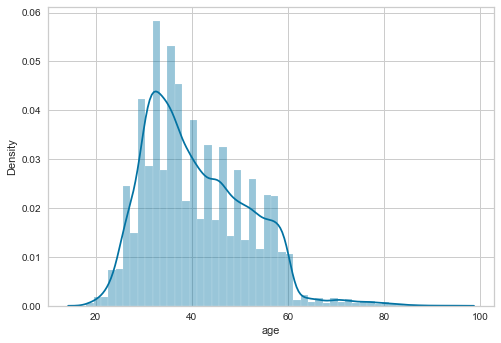


DIST PLOT for 'balance'


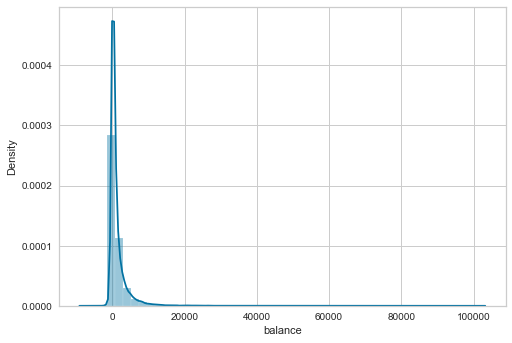


DIST PLOT for 'day'


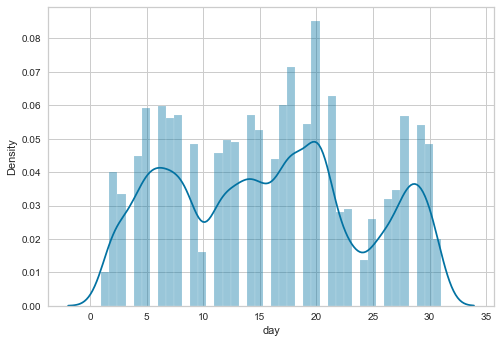


DIST PLOT for 'duration'


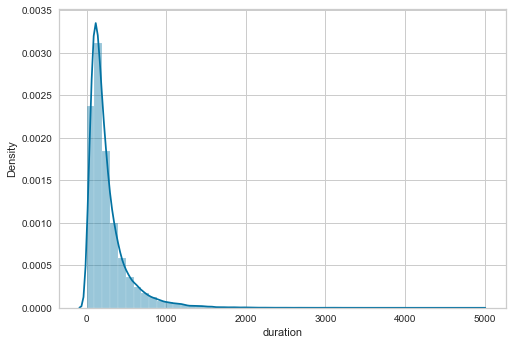


DIST PLOT for 'campaign'


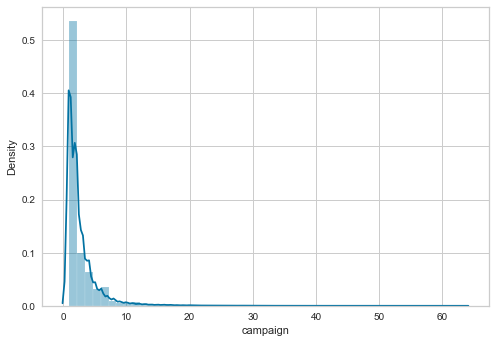


DIST PLOT for 'pdays'


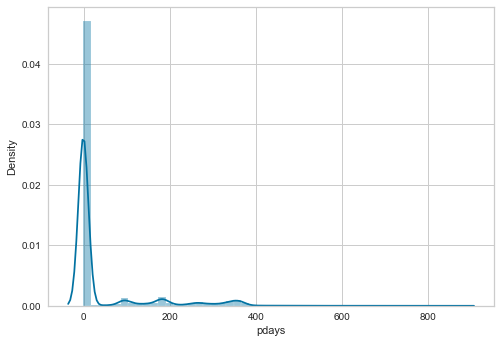


DIST PLOT for 'previous'


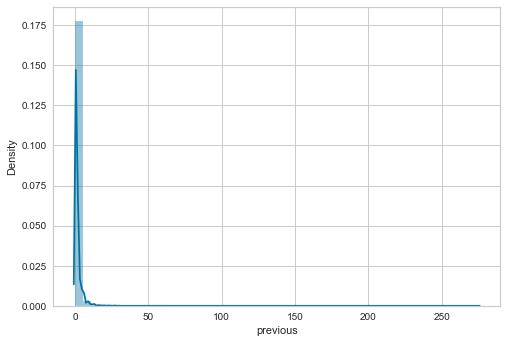

In [ ]:
# Univariate for numerical columns:
# DistPlots
#b. Strategies to address the different data challenges such as data pollution, outlier’s treatment and missing values treatmen

for i in ['age','balance','day','duration', 'campaign', 'pdays', 'previous']:
    sns.distplot(bankDF[i])
    print("DIST PLOT for '{0}'".format(i))
    plt.show()
    print()

BOX PLOT for 'age'


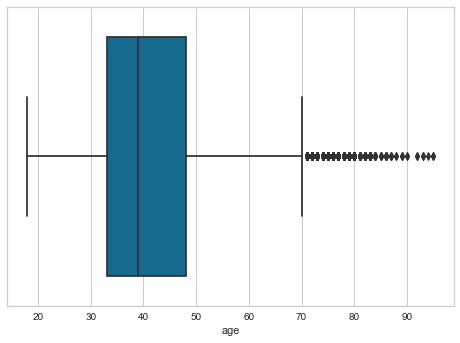


BOX PLOT for 'balance'


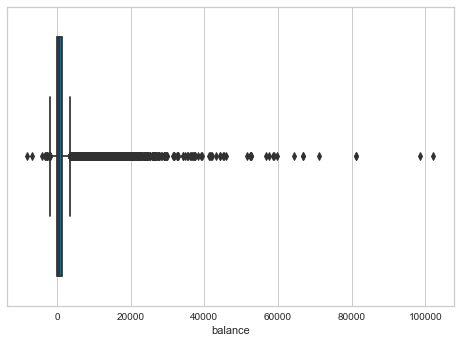


BOX PLOT for 'day'


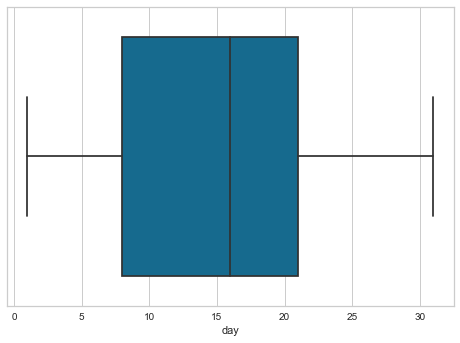


BOX PLOT for 'duration'


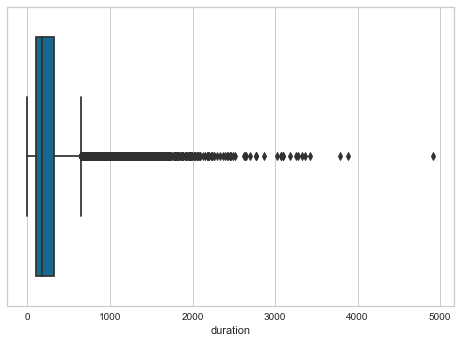


BOX PLOT for 'campaign'


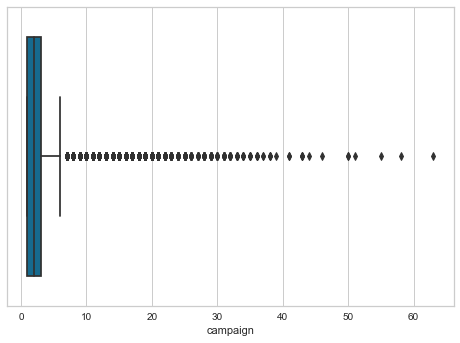


BOX PLOT for 'pdays'


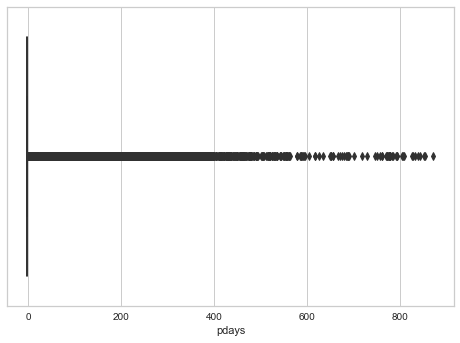


BOX PLOT for 'previous'


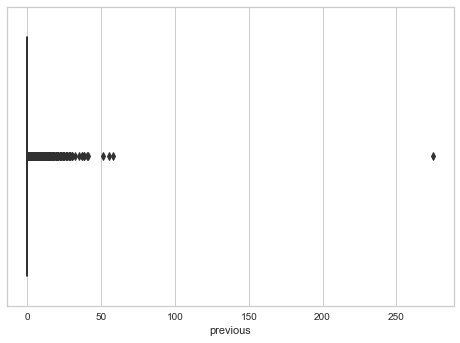

In [ ]:
# Univariate for numerical columns:
# Boxplots
#b. Strategies to address the different data challenges such as data pollution, outlier’s treatment and missing values treatmen

for i in ['age','balance','day','duration', 'campaign', 'pdays', 'previous']:
    sns.boxplot(bankDF[i])
    print("BOX PLOT for '{0}'".format(i))
    plt.show()
    print()

## INFERENCE for numerical features (from the above outputs)

### 1. Feature 'age'
    - age of the client of the banking institution
    - From the distribution plot, the majority of distribution is between 30-50 (with mean ~41 and median 39) and there is a tail towards right.
    - The dist plot is slightly skewed towards right - mean>meadian - proves that. And skewness value is also +ve
    - There are no NULL or missing values or negative values for this feature
    - From the 5 number summary and the boxplot, we see that there are outliers for upper values. But, we don't need to address this as this is bank data and bank data has skewed applicants. But, the proportion of datasets > upper whisker is about 1%, so we can drop these rows or not - don't think it will impact
    
### 2. Feature 'balance'
    - balance in account of the client
    - From the distribution plot, most of the distribution is between 0-5000 (with mean ~1362 and median 448) and there is an long upper tail towards right.
    - The dist plot is highly skewed towards right - mean>meadian - proves that. And skewness value is also +ve
    - There are no NULL or missing values.
    - There negative values for this feature. As this is bank data and we will have negative balances and will impact for the bank to provide offer for term deposit for people with < 0 balances. Let's not drop these rows.
    - From the 5 number summary and the boxplot, we see that there are outliers both above and below. But, we don't need to address this as this is bank data and bank data has skewed applicants. But, the proportion of datasets > upper whisker is about 10%, out of which only 2% subscribed. Candidate for dropping these rows.


### 3.  Feature 'day'
    - the last day of the contact made with the client from the marketing dept for this campaign for the month
    - From the distribution plot, seems the distribution is normalized (with mean ~15.8 and median 16) 
    - The dist plot is not skewed much. Value is ~0.
    - There are no NULL or missing values or negative values.
    - From the 5 number summary and the boxplot, we see that there are NO outliers. 
    
### 4. Feature 'duration'
    - last contact duration in seconds. 
    - From the distribution plot, most of the distribution is between 0-300 (with mean ~260 and median 180) and there is an long upper tail towards right.
    - The dist plot is skewed towards right - mean>meadian - proves that. And skewness value is also +ve
    - There are no NULL or missing values or negative values
    - From the 5 number summary and the boxplot, we see that there are outliers for upper values. Tthe proportion of datasets > upper whisker is about 8%, out of which there is almost equal subscription. Candidate for dropping these rows.
    - Can we drop this column? let's decide in multivariate
    
### 5. Feature 'campaign'  
    - number of contacts performed for this campaign for this client
    - From the distribution plot, most of the distribution is between 0-4 (with mean ~2.8 and median 2) and there is an long upper tail towards right.
    - The dist plot is skewed towards right - mean>meadian - proves that. And skewness value is also +ve
    - There are no NULL or missing values or negative values
    - From the 5 number summary and the boxplot, we see that there are outliers for upper values. Tthe proportion of datasets > upper whisker is about 7%, out of which predominantly its a NO subscription. Candidate for dropping these rows.


### 6. Feature 'pdays'  
    - days passed by after the client was last contacted from a previous campaign -1 denotes either never contacted or more than 900 days
    - From the distribution plot, most of the distribution is between -1 and 0(with mean 40 and median -1) and there is an long upper tail towards right.
    - The dist plot is skewed towards right - mean>meadian - proves that. And skewness value is also +ve
    - There are no NULL or missing values 
    - There are negative values in fact ~ 37,000 rows have -1 values out of the 45K row dataset. We can impute to 0. 
    - From the 5 number summary and the boxplot, we see that there are outliers for upper values. Tthe proportion of datasets > upper whisker is about 20%, out of which predominantly its a NO subscription (15%. Candidate for dropping these rows.


### 7. Feature 'previous'  
    - number of contacts performed before this campaign for the client
    - A correlation is there between pdays and previous. Whenever pdays is -1, the previous is 0. And the no. of such rows is almost 37,000 i.e. 80%. We can safely drop one of the columns totally.
    - From the distribution plot, most of the distribution is  is at 0(with mean 0,6 and median 0) and there is an long upper tail towards right.
    - The dist plot is skewed towards right - mean>meadian - proves that. And skewness value is also +ve
    - There are no NULL or missing values or negative values
    - From the 5 number summary and the boxplot, we see that there are outliers for upper values. Tthe proportion of datasets > upper whisker is about 20%, out of which predominantly its a NO subscription (15%. Candidate for dropping these rows. THIS IS exactly like pdays. We can safely drop one of the column.


### IMPACT OF OUTLIERS FOR NUMERICAL VALUES TO THE TARGET

In [ ]:
# Impact of outliers for numerical values to the Target
print('age \n',pd.crosstab(bankDF['age']>70.5,bankDF['Target'],normalize=True)*100)
print()
print('balance \n', pd.crosstab(bankDF['balance']>3462,bankDF['Target'],normalize=True)*100)
print()
print('duration \n', pd.crosstab(bankDF['duration']>643,bankDF['Target'],normalize=True)*100)
print()
print('campaign \n', pd.crosstab(bankDF['campaign']>6,bankDF['Target'],normalize=True)*100)
print()
bankDF.pdays.value_counts()
print()
print('pdays \n', pd.crosstab(bankDF['pdays']==-1,bankDF['Target'],normalize=True)*100)
print()
print('previous \n', pd.crosstab(bankDF['previous']>0,bankDF['Target'],normalize=True)*100)


age 
 Target         no        yes
age                         
False   87.706532  11.216297
True     0.594988   0.482184

balance 
 Target          no        yes
balance                      
False    79.573555  10.004203
True      8.727964   1.694278

duration 
 Target           no       yes
duration                     
False     84.797947  8.046714
True       3.503572  3.651766

campaign 
 Target           no        yes
campaign                      
False     81.880516  11.342372
True       6.421004   0.356108


pdays 
 Target         no       yes
pdays                      
False   14.049678  4.213576
True    74.251841  7.484904

previous 
 Target           no       yes
previous                     
False     74.251841  7.484904
True      14.049678  4.213576


# UNIVARIATE analysis for Categorical columns

In [ ]:
print("Following are the Categorical Columns (nominal/ordinal):")
for cat in bankDF.columns: # Loop through all columns in the dataframe
    if bankDF[cat].dtype != 'int64': # Only apply for columns with object
        print(cat)

Following are the Categorical Columns (nominal/ordinal):
job
marital
education
default
housing
loan
contact
month
poutcome
Target


In [ ]:
desc=bankDF.describe(include='category').T # describe with category to get the categorical values
desc

,count,unique,top,freq
job,45211,12,blue-collar,9732
marital,45211,3,married,27214
education,45211,4,secondary,23202
default,45211,2,no,44396
housing,45211,2,yes,25130
loan,45211,2,no,37967
contact,45211,3,cellular,29285
month,45211,12,may,13766
poutcome,45211,4,unknown,36959
Target,45211,2,no,39922


In [ ]:
# Value counts of Dtype of Object
for feature in bankDF.columns: # Loop through all columns in the dataframe
    if bankDF[feature].dtype != 'int64': # Only apply for columns with category
        print(bankDF[feature].value_counts())

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64
married     27214
single      12790
divorced     5207
Name: marital, dtype: int64
secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64
no     44396
yes      815
Name: default, dtype: int64
yes    25130
no     20081
Name: housing, dtype: int64
no     37967
yes     7244
Name: loan, dtype: int64
cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64
may    13766
jul     6895
aug     6247
jun     5341
nov     3970
apr     2932
feb     2649
jan     1403
oct      738
sep      579
mar      477
dec      214
Name: month, dtype: int64
unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome, dtype: int64
n

## Inference:
    - Immediate look from the description is that following needs one-hot coding
        - job
        - marital
        - contact
        - month
        - education
    - While the following we can treat as ordinal categorical and assign values based on the 
        - poutcome
    - Following is binary. Can be treated as ordinal
        - default
        - housing
        - loan
    - Target is target variable, can be treated as ordinal. (convert back to category during split)

    

COUNT PLOT for 'job'


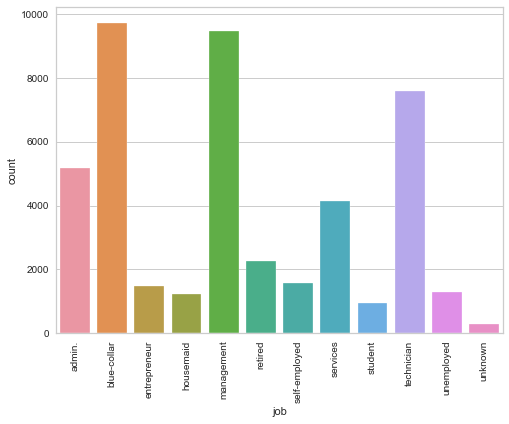


COUNT PLOT for 'marital'


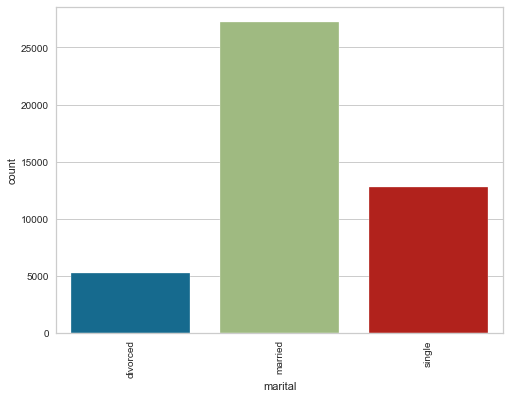


COUNT PLOT for 'education'


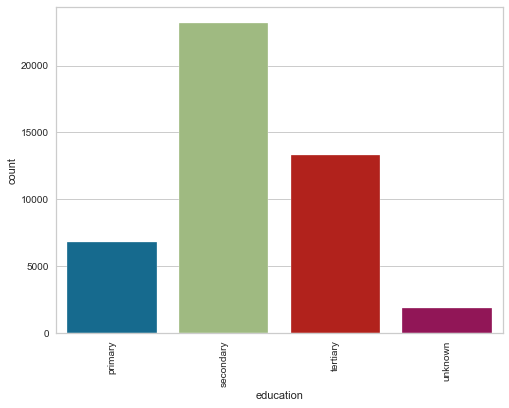


COUNT PLOT for 'default'


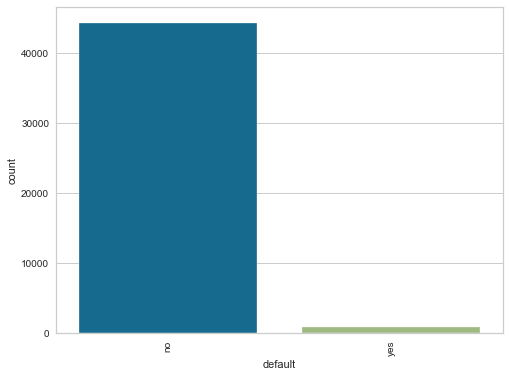


COUNT PLOT for 'housing'


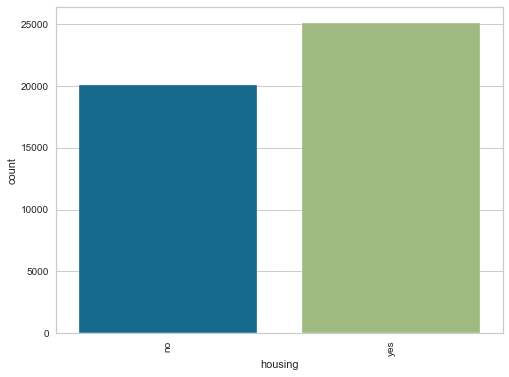


COUNT PLOT for 'loan'


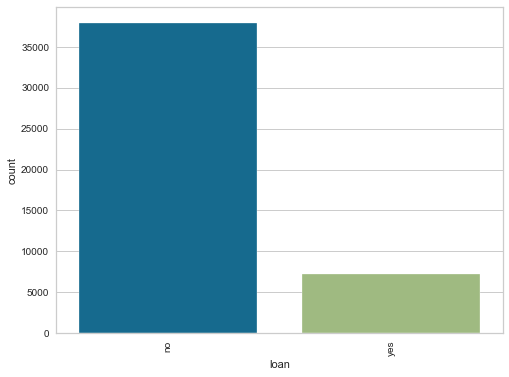


COUNT PLOT for 'contact'


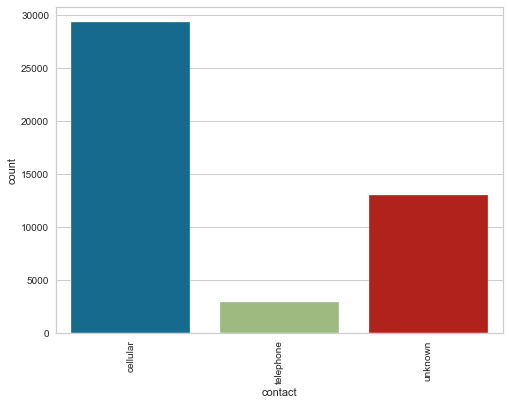


COUNT PLOT for 'month'


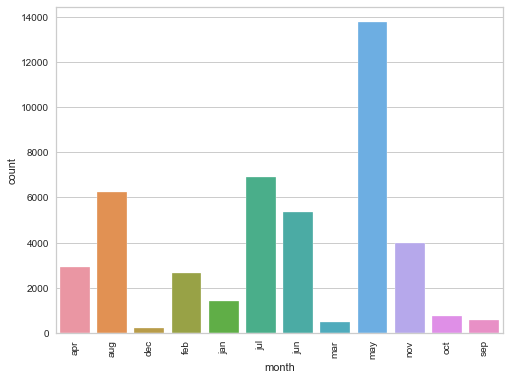


COUNT PLOT for 'poutcome'


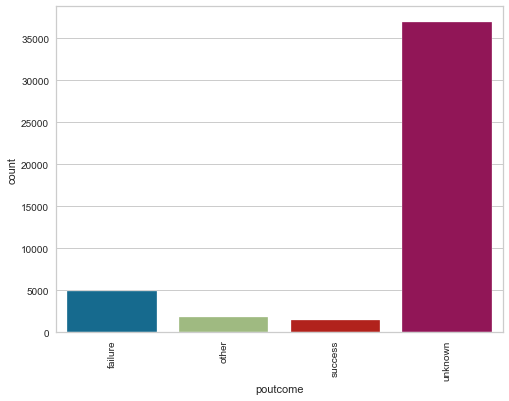


COUNT PLOT for 'Target'


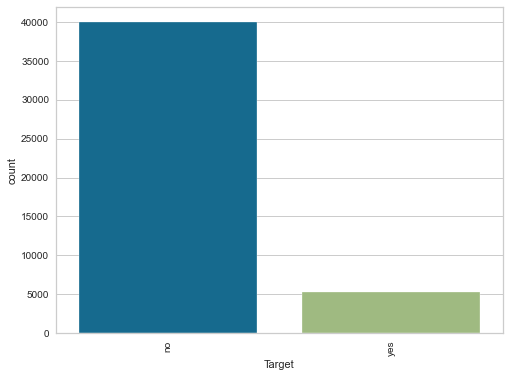

In [ ]:
# univariate plots for the cat columns

for cat in bankDF.columns: # Loop through all columns in the dataframe
    if bankDF[cat].dtype != 'int64': # Only apply for columns with category
        plt.figure(figsize=(8,6))
        sns.countplot(bankDF[cat])
        print("COUNT PLOT for '{0}'".format(cat))
        plt.xticks(rotation=90)
        plt.show()
        print()

## INFERENCE for categorical features (from the above outputs)

### 1. Feature 'job'
    - denotes the type of job takes 12 unique values with job 'blue-collar' having the highest frequency (9732) followed by 'management' and 'technician' job categories.

### 2. Feature 'marital'
    - denotes the client's marital status and takes 3 unique values with status 'married' having the highest frequency followed by single and divorced.
    
### 3. Feature 'education'
    - denotes the client's education level and takes 4 unique values with education 'secondary' having the highest frequency followed by tertiary, primary follwed by unknown. There are some unknown category education that constitures about ~1900 rows 

### 4. Feature 'default'
    - denotes the client's credit level and takes 2 unique values with client with default 'no' having the highest frequency
    - Note that clients whose credit is in default ('yes'), the term deposit subscription is very low - almost negligible
    
### 5. Feature 'housing'
    - denotes if the client has housing loan takes 2 unique values with client with housing loan 'yes' having the highest frequency
   
    
### 6. Feature 'loan'
    - denotes if the client has personal loan takes 2 unique values with client with personal loan 'no' having the highest frequency
  

### 7. Feature 'contact'
    - denotes the contact communication type with the client. It has 3 unique values with 'cellular' having the highest frequency followed by 'unknown' and 'telephone'. Unknown contributed to about ~13000 rows.
    
### 8. Feature 'month'
    - denotes the last contact month with the client. It has 12 unique values with 'may' having the highest frequency followed by 'july' and 'aug'. 
  
    
### 9. Feature 'poutcome'
    - denotes the outcome of previous marketing campaign. It has 4 unique values with 'unknown' having the highest frequency followed by 'failure', 'other', and 'success'. Unknown label has abour 37,000 rows.
        
### 9. TARGET Feature 'Target'
    - denotes if the client has subscribed to Term deposit or not.. It has 2 unique values with 'no' having the highest frequency.
    - This is a highly imbalanced data with following stats.
    - NO has ~40K and YES has ~5K.
    - Need to balance the output


### Notes for self:
    - balance - drop outliers
    - duration - drop column
    - campaign - drop outliers
    - pdays or previous - drop one of the column
    - pdays - impute to 0?
    - one hot for : job, marital, contact, month
    - ordinality restruct for : education, default, housing, loan, poutcome
    - Target seem to be imbalanced - need to know what / how to do. We will struct it as well and convert to Category before splittig and training

# Deliverable 1B : BI-VARIATE ANALYSIS

    - Bi-variate analysis between the predictor variables and target column. Comment on your findings in terms of their relationship and degree of relation if any. Visualize the analysis using boxplots and pair plots, histograms or density curves. Select the most appropriate attributes.


In [ ]:
bankDF.corr()

,age,balance,day,duration,campaign,pdays,previous
age,1.000000,0.097783,-0.009120,-0.004648,0.004760,-0.023758,0.001288
balance,0.097783,1.000000,0.004503,0.021560,-0.014578,0.003435,0.016674
day,-0.009120,0.004503,1.000000,-0.030206,0.162490,-0.093044,-0.051710
duration,-0.004648,0.021560,-0.030206,1.000000,-0.084570,-0.001565,0.001203
campaign,0.004760,-0.014578,0.162490,-0.084570,1.000000,-0.088628,-0.032855
pdays,-0.023758,0.003435,-0.093044,-0.001565,-0.088628,1.000000,0.454820
previous,0.001288,0.016674,-0.051710,0.001203,-0.032855,0.454820,1.000000


#### We will start off with groupby and cross tabs with numerical and categorical w.r.t Target and review the data. Also corr of numerical features. After which we will plot histplots for numerical features and boxplots&pairplots for categorical.

In [ ]:
# Before drawing graphs and further analysis, let's first struct Target and change 'yes' and 'no's to 1s and 0s

replaceStruct = {"Target":  {"no": 0, "yes": 1 } }
bankDF=bankDF.replace(replaceStruct)

In [ ]:
bankDF['Target'].value_counts()

0    39922
1     5289
Name: Target, dtype: int64

In [ ]:
bankDF.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,0
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,0
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,0
7,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown,5,may,380,1,-1,0,unknown,0
8,58,retired,married,primary,no,121,yes,no,unknown,5,may,50,1,-1,0,unknown,0
9,43,technician,single,secondary,no,593,yes,no,unknown,5,may,55,1,-1,0,unknown,0


In [ ]:
# Use Groupby and crosstab wrt the Target.
bankDF.groupby('Target').mean()

,age,balance,day,duration,campaign,pdays,previous
Target,,,,,,,
0,40.838986,1303.714969,15.892290,221.182806,2.846350,36.421372,0.502154
1,41.670070,1804.267915,15.158253,537.294574,2.141047,68.702968,1.170354


In [ ]:
bankDF.groupby('Target').median()

,age,balance,day,duration,campaign,pdays,previous
Target,,,,,,,
0,39,417,16,164,2,-1,0
1,38,733,15,426,2,-1,0


In [ ]:
bankDF.corr()

,age,balance,day,duration,campaign,pdays,previous,Target
age,1.000000,0.097783,-0.009120,-0.004648,0.004760,-0.023758,0.001288,0.025155
balance,0.097783,1.000000,0.004503,0.021560,-0.014578,0.003435,0.016674,0.052838
day,-0.009120,0.004503,1.000000,-0.030206,0.162490,-0.093044,-0.051710,-0.028348
duration,-0.004648,0.021560,-0.030206,1.000000,-0.084570,-0.001565,0.001203,0.394521
campaign,0.004760,-0.014578,0.162490,-0.084570,1.000000,-0.088628,-0.032855,-0.073172
pdays,-0.023758,0.003435,-0.093044,-0.001565,-0.088628,1.000000,0.454820,0.103621
previous,0.001288,0.016674,-0.051710,0.001203,-0.032855,0.454820,1.000000,0.093236
Target,0.025155,0.052838,-0.028348,0.394521,-0.073172,0.103621,0.093236,1.000000


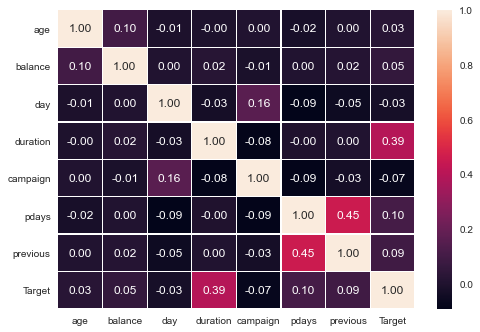

In [ ]:
sns.heatmap(bankDF.corr(),annot=True,cbar=True,linewidths=.2, fmt=".2f")
plt.show()

## Inference : 
    - From above (median) we see that higher the balance and duration the acceptance of the term deposit is high. The rest of numerical features don't have specific impact to the target variable
    - From mean also we can infer the same conclusion though pdays show higher value but the majority of pdays values is -1.
    - We will see the feature importance for these during the correlation as well as for every estimator
    - FRom the Heatmap we see the Target has correlation with duration and pdays/previous. 
    - pdays and previous have correlation also
    - rest all columns have minimal correlation
    - Note that this corr only addresses about 7 predictor overall.

###  BIVARIATE analysis for numerical variables with Target

JOINT PLOT for 'age'


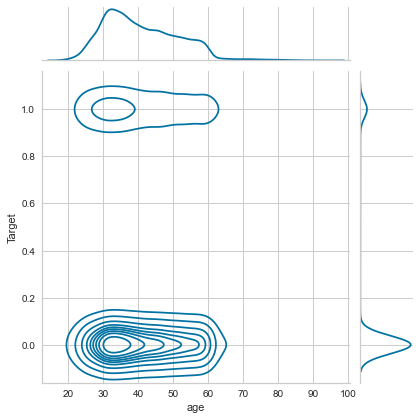


JOINT PLOT for 'balance'


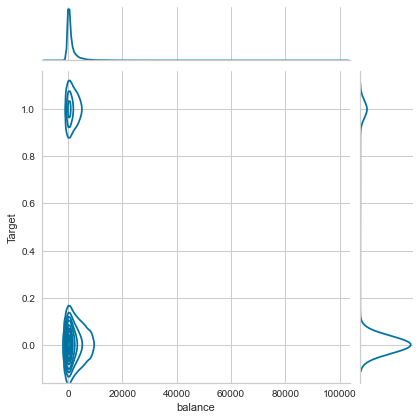


JOINT PLOT for 'day'


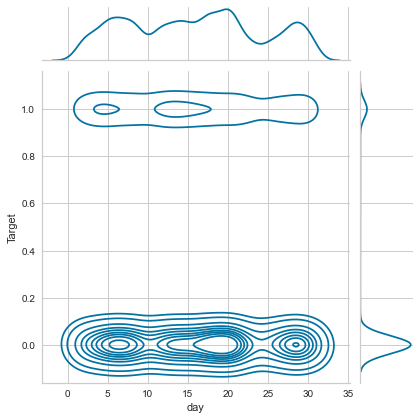


JOINT PLOT for 'duration'


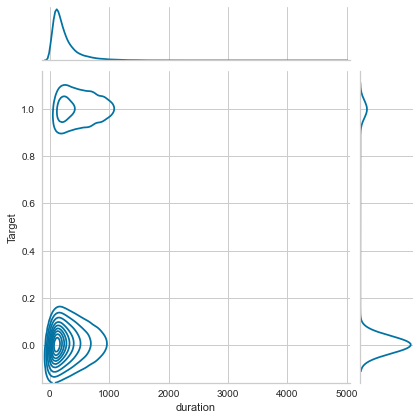


JOINT PLOT for 'campaign'


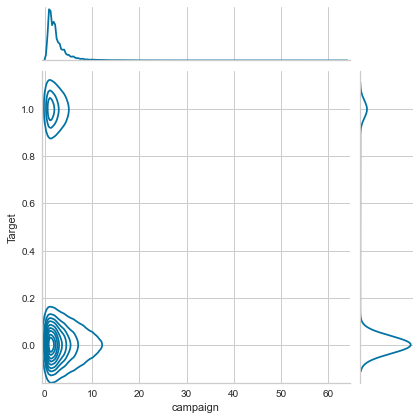


JOINT PLOT for 'pdays'


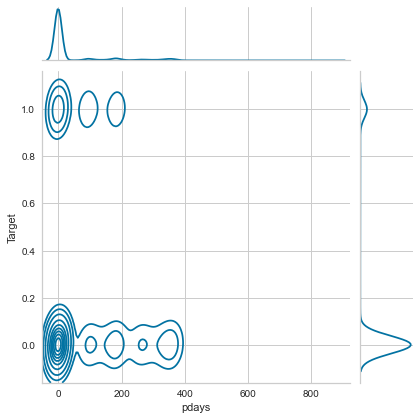


JOINT PLOT for 'previous'


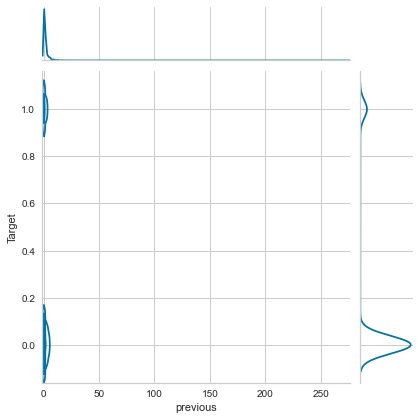

In [ ]:
#age 	balance 	day 	duration 	campaign 	pdays 	previous

# I have used Joint plot with the numerical feature with the target variable and 
# also used kde variable to get the density curve on the univariate graphs and also for the bivariate in the main plot
for numFtr in ['age','balance','day','duration', 'campaign', 'pdays', 'previous']:
    sns.jointplot(bankDF[numFtr], bankDF['Target'], kind='kde')
    print("JOINT PLOT for '{0}'".format(numFtr))
    plt.show()
    print()


JOINT PLOT for 'age'


<Figure size 576x432 with 0 Axes>

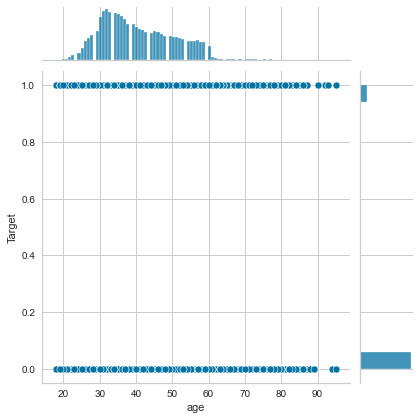


JOINT PLOT for 'balance'


<Figure size 576x432 with 0 Axes>

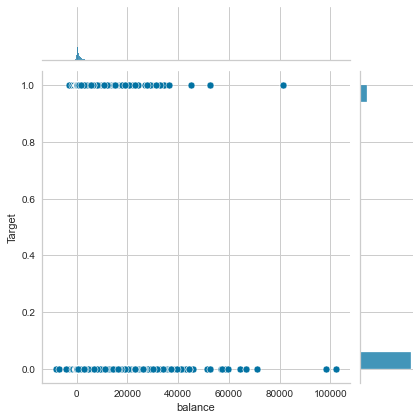


JOINT PLOT for 'day'


<Figure size 576x432 with 0 Axes>

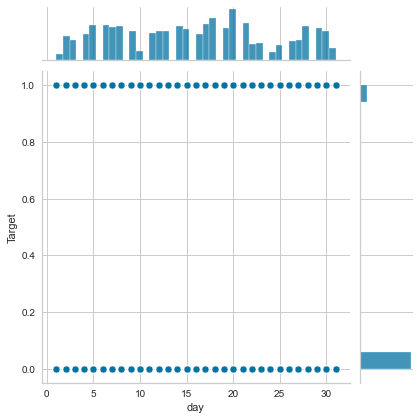


JOINT PLOT for 'duration'


<Figure size 576x432 with 0 Axes>

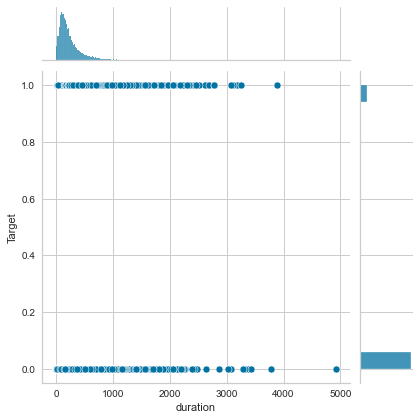


JOINT PLOT for 'campaign'


<Figure size 576x432 with 0 Axes>

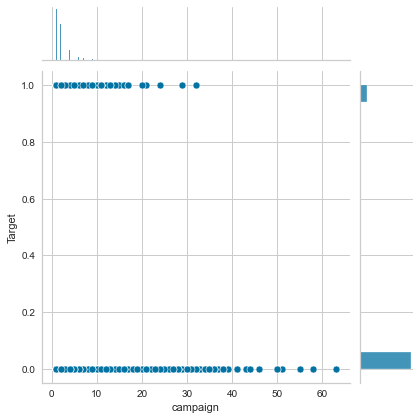


JOINT PLOT for 'pdays'


<Figure size 576x432 with 0 Axes>

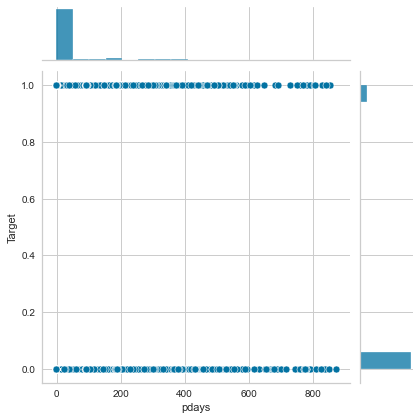


JOINT PLOT for 'previous'


<Figure size 576x432 with 0 Axes>

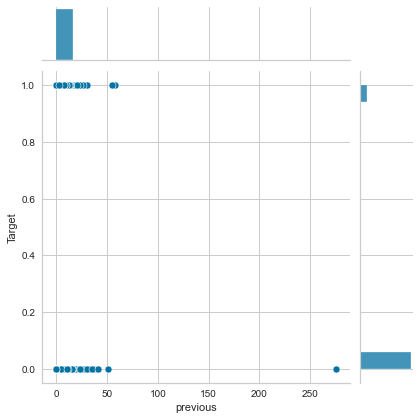

In [ ]:
# I have used Joint plot with the numerical feature with the target variable and 
# with default scatter and hist
for numFtr in ['age','balance','day','duration', 'campaign', 'pdays', 'previous']:
    plt.figure(figsize=(8,6))
    sns.jointplot(bankDF[numFtr], bankDF['Target']);
    print("JOINT PLOT for '{0}'".format(numFtr))
    plt.show()
    print()

BOX PLOT for 'age'


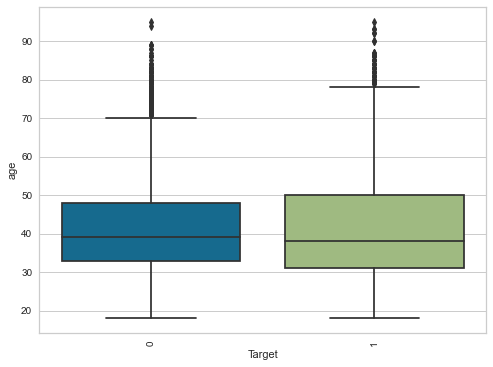


BOX PLOT for 'balance'


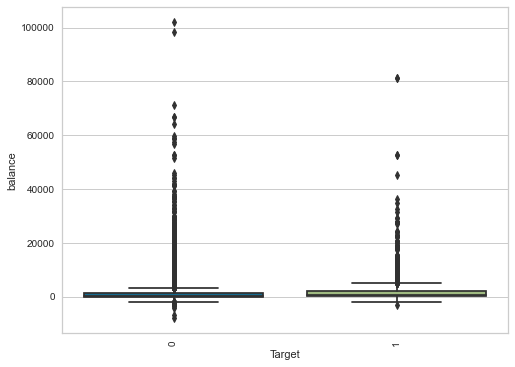


BOX PLOT for 'day'


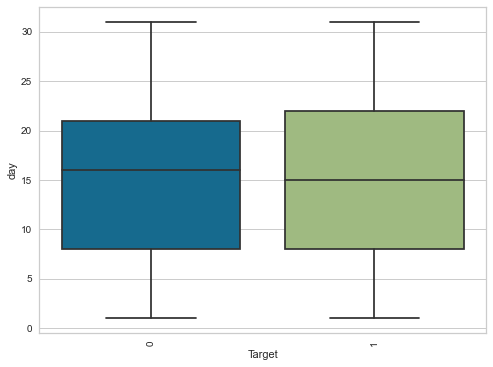


BOX PLOT for 'duration'


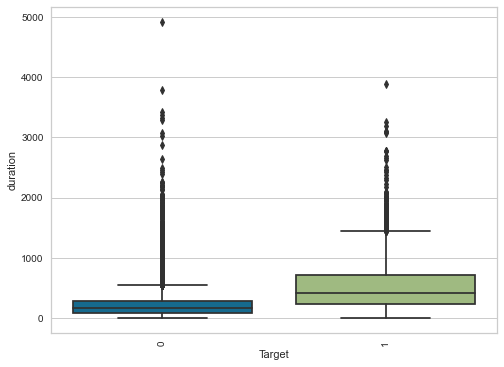


BOX PLOT for 'campaign'


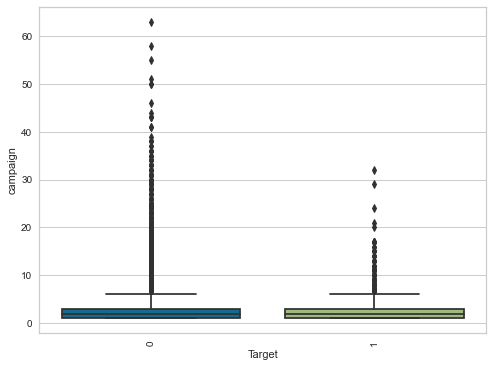


BOX PLOT for 'pdays'


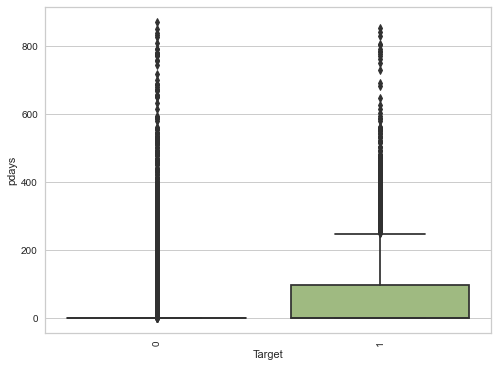


BOX PLOT for 'previous'


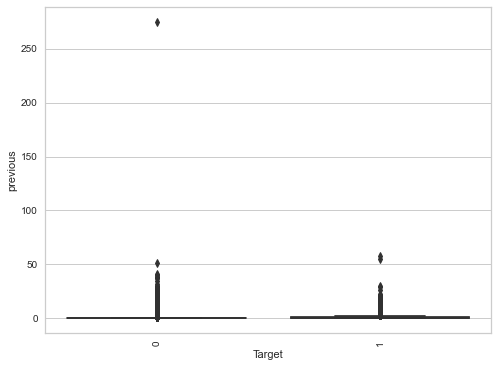

In [ ]:
# I have used box plot with the numerical feature with the target variable and 

for numFtr in ['age','balance','day','duration', 'campaign', 'pdays', 'previous']:
    plt.figure(figsize=(8,6))
    sns.boxplot(bankDF['Target'], bankDF[numFtr])
    print("BOX PLOT for '{0}'".format(numFtr))
    plt.xticks(rotation=90)
    plt.show()
    print()

STRIP PLOT for 'age'


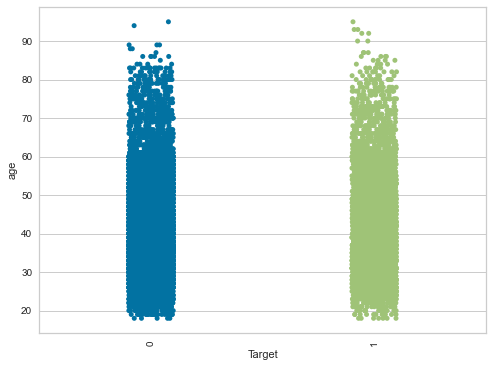


STRIP PLOT for 'balance'


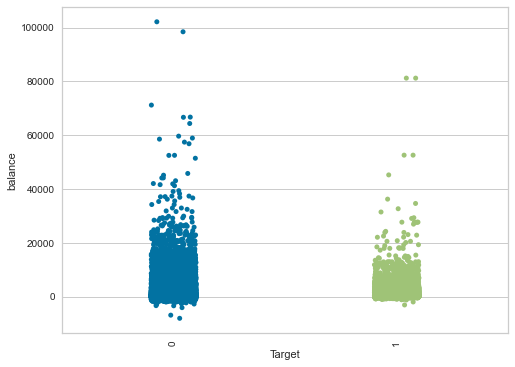


STRIP PLOT for 'day'


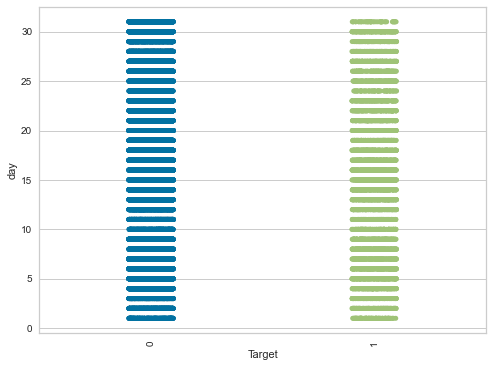


STRIP PLOT for 'duration'


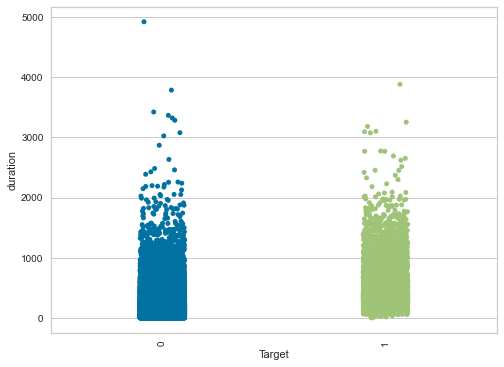


STRIP PLOT for 'campaign'


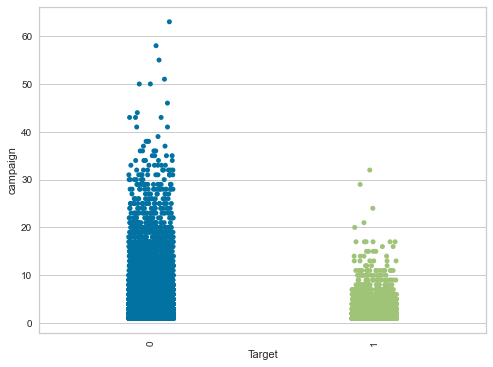


STRIP PLOT for 'pdays'


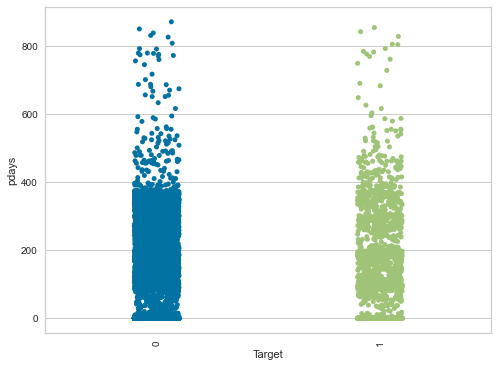


STRIP PLOT for 'previous'


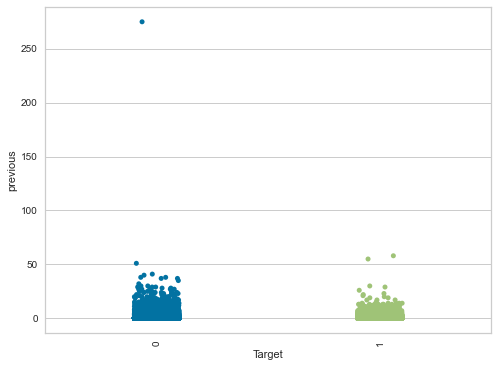

In [ ]:
for numFtr in ['age','balance','day','duration', 'campaign', 'pdays', 'previous']:
    plt.figure(figsize=(8,6))
    sns.stripplot(x=bankDF['Target'], y=bankDF[numFtr], jitter=True)
    print("STRIP PLOT for '{0}'".format(numFtr))
    plt.xticks(rotation=90)
    plt.show()
    print()

## Inference with above kde, scatter/histo, boxplots, and stripplots for numerical with Target

  #### In general, the numerical columns for this dataset have quite a bit outliers - esply for balance, campaign, pday, previous, duration. We will address this by either dropping the rows by using the upper whisker calculation done earlier. This will be done as part of the data preparation
  
  #### 1. age with Target - 
        - We can infer that the age of the client who subscribed to Term Deposit is in the range 28-40 - with the peak density in 30-35 age range
        - Likewise for clients who have not subscribed the concentration is around 30-35, but there are clients in age group 40+ to 60 who have not subscribed
    
   #### 2. balance with Target - 
        - We can infer that the balance in account of the client who subscribed to Term Deposit is in the range negative balance to max 5000 - with the peak density in range 0-500
        - Likewise for clients who have not subscribed the concentration is around 0, but there are clients in higher balance who have not subscribed too. 
        - There ar emany more in negative balance who have declined the suscription that who have accepted
        
   #### 3.  day with Target - 
        - We can infer that there is no particular trend for which day clients though from days 15-20 there is higher concentration. 
        
   #### 4. duration with Target - 
        - We can infer that the duration of contact with the client who subscribed to Term Deposit is in the range 50-300 seconds
        - For clients who have not subscribed the concentration is around 0, but there are clients in higher balance who have not subscribed too. 
        
   #### 5. campaign with Target - 
        - We can infer that the numer of contacts with the client who subscribed to Term Deposit can be determined between 0-5 contact instances as the concentration is highest during this time
        - Corollary, likewise for clients who have not subscribed can be known in first 0-5 contact instances
     
   #### 6. pdays with Target - 
        - pdays concentration is more towards negative value meaning majority are either not contacted from previous campaign or the duration is more than 900 days. 
        - the approval for the current campaign for the term deposit subscription is also more concentrated from -1 to 30 days from previous contact with the client. There are some approvals in pockets around 100 and 200 days.
        - while the clients have declined more for whom the contact is either not there or the contact is more than 900 days.
        
   #### 7. previous with Target - 
        - "previous" concentration is more in the range 0-7 daysfor clients to approve for the subscription for this campaign. This is same for decline also.

### For categorical columns wrt Target

In [ ]:
bankDF.dtypes

age             int64
job          category
marital      category
education    category
default      category
balance         int64
housing      category
loan         category
contact      category
day             int64
month        category
duration        int64
campaign        int64
pdays           int64
previous        int64
poutcome     category
Target          int64
dtype: object

In [ ]:
print("Following are the Categorical Columns (nominal/ordinal):")
for cat in bankDF.columns: # Loop through all columns in the dataframe
    if bankDF[cat].dtype != 'int64': # Only apply for columns with object
        print(cat)

Following are the Categorical Columns (nominal/ordinal):
job
marital
education
default
housing
loan
contact
month
poutcome


In [ ]:
# Crosstab for the categorical(non-numerical)
for cross in bankDF.columns: # Loop through all columns in the dataframe
    if bankDF[cross].dtype != 'int64':
        print(pd.crosstab(bankDF['Target'],bankDF[cross], normalize='index')*100)
        print('**********************************************************************')

job        admin.  blue-collar  entrepreneur  housemaid  management   retired  \
Target                                                                          
0       11.372176    22.604078      3.416662   2.833024   20.432343  4.378538   
1       11.930422    13.386273      2.325581   2.060881   24.598223  9.756098   

job     self-employed  services   student  technician  unemployed   unknown  
Target                                                                       
0            3.486799  9.480988  1.675768   16.925505    2.757878  0.636241  
1            3.535640  6.976744  5.086028   15.882019    3.819247  0.642844  
**********************************************************************
marital   divorced    married     single
Target                                  
0        11.484896  61.266971  27.248134
1        11.760257  52.089242  36.150501
**********************************************************************
education    primary  secondary   tertiary   unknown
Targ

COUNT PLOT for 'job'


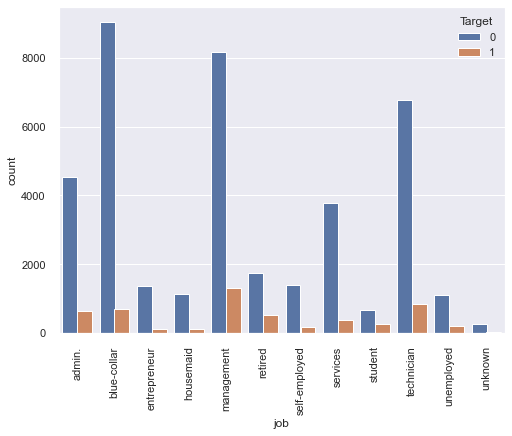


COUNT PLOT for 'marital'


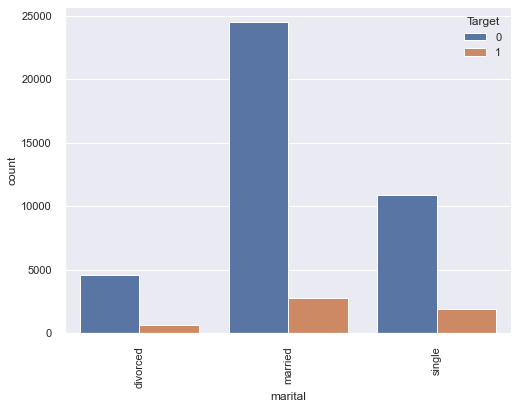


COUNT PLOT for 'education'


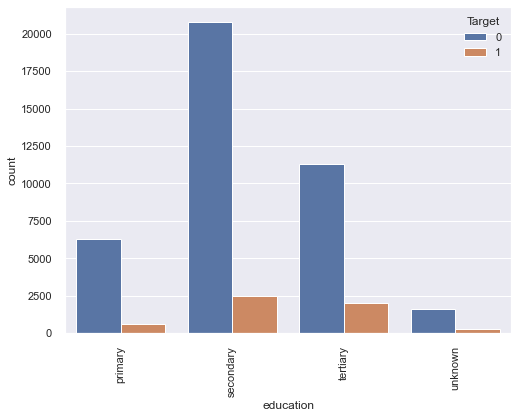


COUNT PLOT for 'default'


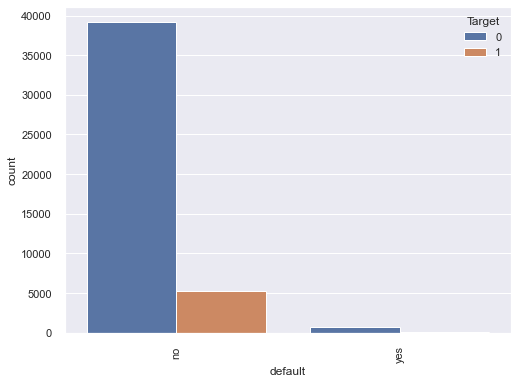


COUNT PLOT for 'housing'


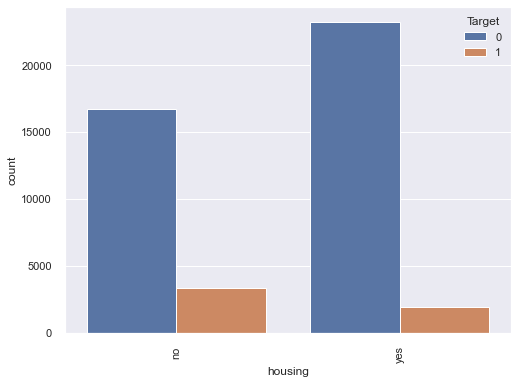


COUNT PLOT for 'loan'


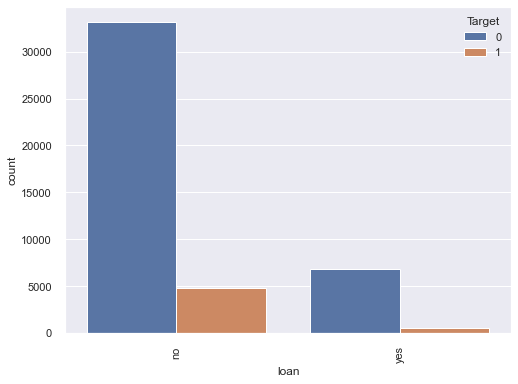


COUNT PLOT for 'contact'


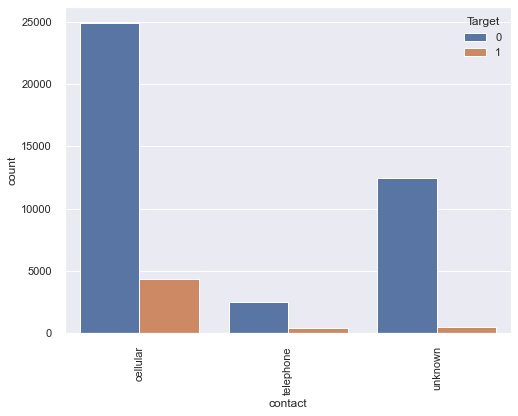


COUNT PLOT for 'month'


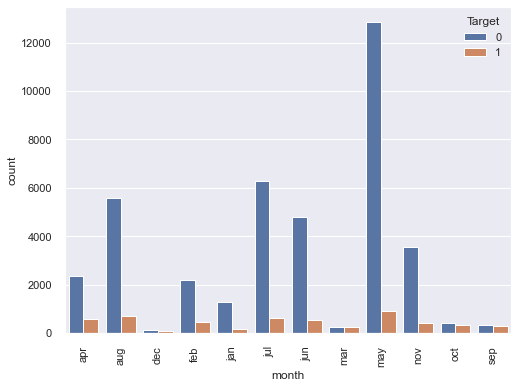


COUNT PLOT for 'poutcome'


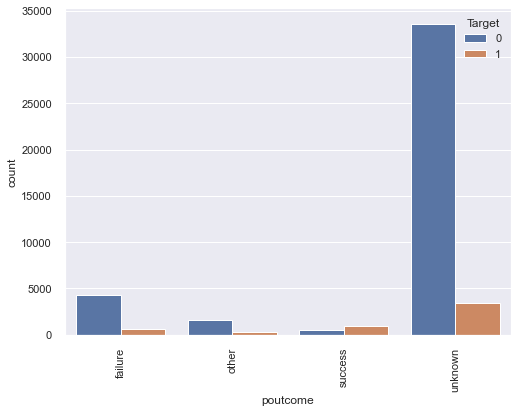

In [ ]:
for cat in bankDF.columns: # Loop through all columns in the dataframe
    if bankDF[cat].dtype != 'int64': # Only apply for columns with category
        plt.figure(figsize=(8,6))
        sns.countplot(bankDF[cat], hue=bankDF['Target'])
        print("COUNT PLOT for '{0}'".format(cat))
        plt.xticks(rotation=90)
        plt.show()
        print()

## INFERENCE for categorical features (from the above outputs - graphs as well as the crosstabs)

### 1. Feature 'job'
    - denotes the type of job takes 12 unique values with job 'blue-collar' having the highest frequency (9732) followed by 'management' and 'technician' job categories.
    - in terms of subscription acceptance, clients with 'management' job title accept more followed by 'technician' and 'blue collar'.

### 2. Feature 'marital'
    - denotes the client's marital status and takes 3 unique values with status 'married' having the highest frequency followed by single and divorced.
    - in terms of subscription acceptance, we see the same trend with 'married' client accepting more and then single and divorced clients.
    
### 3. Feature 'education'
    - denotes the client's education level and takes 4 unique values with education 'secondary' having the highest frequency followed by tertiary, primary follwed by unknown. There are some unknown category education that constitures about ~1900 rows 
    - in terms of subscription acceptance, we see the same trend as frequency stated above

### 4. Feature 'default'
    - denotes the client's credit level and takes 2 unique values with client with default 'no' having the highest frequency
    - in terms of subscription acceptance, we see the same trend as frequency stated above
    - Note that clients whose credit is in default ('yes'), the term deposit subscription is very low - almost negligible
    - The default has same distribution, We should check how this feature influences final model using coefficients`
    
### 5. Feature 'housing'
    - denotes if the client has housing loan takes 2 unique values with client with housing loan 'yes' having the highest frequency
    - in terms of subscription acceptance, we see the oppositre trend as frequency stated above i.e, clients with 'no' housing loan have subscribed to the term deposit (Target Yes is higher).
    
    
### 6. Feature 'loan'
    - denotes if the client has personal loan takes 2 unique values with client with personal loan 'no' having the highest frequency
    - in terms of subscription acceptance, we see the same trend as frequency stated above i.e, clients with 'no' personal loan have subscribed to the term deposit (Target Yes is higher).
      - The loan has same distribution, We should check how this feature influences final model using coefficients`

### 7. Feature 'contact'
    - denotes the contact communication type with the client. It has 3 unique values with 'cellular' having the highest frequency followed by 'unknown' and 'telephone'. Unknown contributed to about ~13000 rows.
    - in terms of subscription acceptance, we see the same trend as frequency stated above with telephone and unknown seems comparable
    
### 8. Feature 'month'
    - denotes the last contact month with the client. It has 12 unique values with 'may' having the highest frequency followed by 'july' and 'aug'. 
    - in terms of subscription acceptance, we see that clients whose last contact was done in 'may' taking lead followed by 'aug', 'jul' and 'jun'.
    
    
### 9. Feature 'poutcome'
    - denotes the outcome of previous marketing campaign. It has 4 unique values with 'unknown' having the highest frequency followed by 'failure', 'other', and 'success'. Unknown label has abour 37,000 rows.
    - in terms of subscription acceptance, we see that clients whose previous camapaign status is 'unknown' have subscribed in present campaign followed by 'success', 'failure' and 'other' in that order.



#### We will now address one-hot coding and do ordinal changes to categorical. After which we will do corr matrix & pair plots. This will add in clear understanding of the correlation.

### Notes for self:
    - balance - drop outliers
    - duration - drop column
    - campaign - drop outliers
    - pdays or previous - drop one of the column
    - pdays - impute to 0?
    - one hot for : job, marital, contact, month, education
    - ordinality restruct (Label encoding) for :  default, housing, loan, poutcome - DONE
    - Target seem to be imbalanced - need to know what / how to do. We will struct it as well and convert to Category before splittig and training

In [ ]:
replaceStruct = {
                "default":  {"no": 0, "yes":1},
                "housing":  {"no": 0, "yes":1} ,
                "loan":     {"no": 0, "yes":1} ,
                "poutcome": {"other": 1, "failure": 2 ,"success": 3 ,"unknown":-1}
                }


In [ ]:
bankDF=bankDF.replace(replaceStruct)

In [ ]:
bankDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   age        45211 non-null  int64   
 1   job        45211 non-null  category
 2   marital    45211 non-null  category
 3   education  45211 non-null  category
 4   default    45211 non-null  int64   
 5   balance    45211 non-null  int64   
 6   housing    45211 non-null  int64   
 7   loan       45211 non-null  int64   
 8   contact    45211 non-null  category
 9   day        45211 non-null  int64   
 10  month      45211 non-null  category
 11  duration   45211 non-null  int64   
 12  campaign   45211 non-null  int64   
 13  pdays      45211 non-null  int64   
 14  previous   45211 non-null  int64   
 15  poutcome   45211 non-null  int64   
 16  Target     45211 non-null  int64   
dtypes: category(5), int64(12)
memory usage: 4.4 MB


In [ ]:
# One-hot encoding for 

oneHotCols=["job","marital","contact","month", "education"]
bankDF = pd.get_dummies(bankDF, columns=oneHotCols) #This function does One-Hot-Encoding on categorical text


In [ ]:
bankDF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 46 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   age                  45211 non-null  int64
 1   default              45211 non-null  int64
 2   balance              45211 non-null  int64
 3   housing              45211 non-null  int64
 4   loan                 45211 non-null  int64
 5   day                  45211 non-null  int64
 6   duration             45211 non-null  int64
 7   campaign             45211 non-null  int64
 8   pdays                45211 non-null  int64
 9   previous             45211 non-null  int64
 10  poutcome             45211 non-null  int64
 11  Target               45211 non-null  int64
 12  job_admin.           45211 non-null  uint8
 13  job_blue-collar      45211 non-null  uint8
 14  job_entrepreneur     45211 non-null  uint8
 15  job_housemaid        45211 non-null  uint8
 16  job_management       4

#### The problem is have one-hot encoding brings about large no. of features esply we did one-hot for Job and Month columns. 

In [ ]:
# Correlation function and check for the predictors with Target
pd.DataFrame(bankDF.corr()['Target'])

,Target
age,0.025155
default,-0.022419
balance,0.052838
housing,-0.139173
loan,-0.068185
day,-0.028348
duration,0.394521
campaign,-0.073172
pdays,0.103621
previous,0.093236


#### Inference from above: We see that most of the predictors have no correlation or very weak correlation with the Target.

# DELIVERABLE 2 & 3: PREPARE DATA FOR ANALYTICS & USE MODELS
1. Ensure the attribute types are correct. If not, take appropriate actions.
2. Get the data model ready.
3. Transform the data i.e. scale / normalize if required
4. Create the training set and test set in ratio of 70:30


In [ ]:
# datatype

bankDF.dtypes

age                    int64
default                int64
balance                int64
housing                int64
loan                   int64
day                    int64
duration               int64
campaign               int64
pdays                  int64
previous               int64
poutcome               int64
Target                 int64
job_admin.             uint8
job_blue-collar        uint8
job_entrepreneur       uint8
job_housemaid          uint8
job_management         uint8
job_retired            uint8
job_self-employed      uint8
job_services           uint8
job_student            uint8
job_technician         uint8
job_unemployed         uint8
job_unknown            uint8
marital_divorced       uint8
marital_married        uint8
marital_single         uint8
contact_cellular       uint8
contact_telephone      uint8
contact_unknown        uint8
month_apr              uint8
month_aug              uint8
month_dec              uint8
month_feb              uint8
month_jan     

#### All features have numerical dtype. The output Target need to be converted to categorical

In [ ]:
# we will split the Target to a separate DF
X = bankDF.drop('Target', axis=1)
Y = bankDF['Target'].astype('category') 


In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 45 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   age                  45211 non-null  int64
 1   default              45211 non-null  int64
 2   balance              45211 non-null  int64
 3   housing              45211 non-null  int64
 4   loan                 45211 non-null  int64
 5   day                  45211 non-null  int64
 6   duration             45211 non-null  int64
 7   campaign             45211 non-null  int64
 8   pdays                45211 non-null  int64
 9   previous             45211 non-null  int64
 10  poutcome             45211 non-null  int64
 11  job_admin.           45211 non-null  uint8
 12  job_blue-collar      45211 non-null  uint8
 13  job_entrepreneur     45211 non-null  uint8
 14  job_housemaid        45211 non-null  uint8
 15  job_management       45211 non-null  uint8
 16  job_retired          4

In [ ]:
Y.dtype 

CategoricalDtype(categories=[0, 1], ordered=False)

### From here on we will use X and Y for further data transformations.
    - X has all predictor features and all numeric dtypes, while
    - Y has Target/output feature and of Category type.


### Notes for self:
    - balance - drop outliers
    - duration - drop column
    - campaign - drop outliers
    - pdays or previous - drop one of the column
    - pdays - impute to 0?
    - one hot for : job, marital, contact, month, education - COMPLETE
    - ordinality restruct (Label encoding) for :  default, housing, loan, poutcome - COMPLETE
    - Target seem to be imbalanced - need to know what / how to do. We will struct it as well and convert to Category before splittig and training

### First use existing data - and check for the Logit and DT. And the Ensemble estimators. No need for any data tranformations as YET

In [ ]:
X

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,education_primary,education_secondary,education_tertiary,education_unknown
0,58,0,2143,1,0,5,261,1,-1,0,...,0,0,1,0,0,0,0,0,1,0
1,44,0,29,1,0,5,151,1,-1,0,...,0,0,1,0,0,0,0,1,0,0
2,33,0,2,1,1,5,76,1,-1,0,...,0,0,1,0,0,0,0,1,0,0
3,47,0,1506,1,0,5,92,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
4,33,0,1,0,0,5,198,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,0,825,0,0,17,977,3,-1,0,...,0,0,0,1,0,0,0,0,1,0
45207,71,0,1729,0,0,17,456,2,-1,0,...,0,0,0,1,0,0,1,0,0,0
45208,72,0,5715,0,0,17,1127,5,184,3,...,0,0,0,1,0,0,0,1,0,0
45209,57,0,668,0,0,17,508,4,-1,0,...,0,0,0,1,0,0,0,1,0,0


In [ ]:
Y.to_frame()

,Target
0,0
1,0
2,0
3,0
4,0
...,...
45206,1
45207,1
45208,1
45209,0


### DATA SPLIT 1 : Split the data into training and test set in the ratio of 70:30 respectively
 #### We will use same split of data for Logit, DT, bagging (bagging & randomforest), boosting (ADAboost, gradientboost)

In [ ]:
# Train : Test :: 70:30
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.30,random_state=1)

In [ ]:
X.shape, X_train.shape, X_test.shape

((45211, 45), (31647, 45), (13564, 45))

### Model 1 : Logistic Regression

In [ ]:
Logit = LogisticRegression(random_state=6579,fit_intercept=False, solver="liblinear")
#Create an instance of the Logit and fit the model on train data.
Logit.fit(X_train, Y_train)                    

LogisticRegression(fit_intercept=False, random_state=6579, solver='liblinear')

In [ ]:
Logit.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': False,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 6579,
 'solver': 'liblinear',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [ ]:
#Predict
Y_predict = Logit.predict(X_test)              # Predicting the target variable on test data

In [ ]:
# Observe the predicted and test(observed) feature and targets in a dataframe.

Z = X_test.copy()#  create a copy of the X test
Z['True Target'] = Y_test # add a column of observed Y
Z['Predicted Target'] = Y_predict # add a column of predicted Y
Z.head()

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_may,month_nov,month_oct,month_sep,education_primary,education_secondary,education_tertiary,education_unknown,True Target,Predicted Target
3610,42,0,2519,1,0,15,262,4,-1,0,...,1,0,0,0,1,0,0,0,0,0
11677,37,0,2209,0,0,20,167,2,-1,0,...,0,0,0,0,0,1,0,0,0,0
33018,32,0,923,1,0,17,819,4,-1,0,...,0,0,0,0,0,1,0,0,0,0
44323,53,0,306,0,0,28,388,3,181,1,...,0,0,0,0,1,0,0,0,1,0
8119,32,0,257,1,0,2,183,5,-1,0,...,0,0,0,0,0,0,1,0,0,0


In [ ]:
# Confusion Matrix HeatMap function

def draw_confusion_matrix(true, predicted):
    cm = confusion_matrix(true, predicted)
    plt.figure(figsize=(8,8))
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels = [0,1] , yticklabels = [0,1] )
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [ ]:
cmLogit = confusion_matrix(Y_test,Y_predict)
cmLogit

array([[11686,   327],
       [ 1073,   478]], dtype=int64)

In [ ]:
# Metrics
#(accuracy, recall, precision, f1score, and roc_auc_score). 
#Draw a heatmap to display confusion matrix

## ACCURACY
print("Trainig accuracy %age ",round(Logit.score(X_train,Y_train)*100,2))  
print()
print("Testing accuracy %age ",round(Logit.score(X_test, Y_test)*100,2))

Trainig accuracy %age  89.92

Testing accuracy %age  89.68


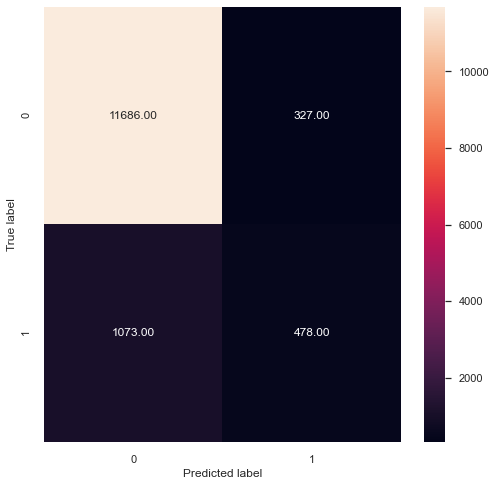

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y_test, Y_predict)

### METRICS

#### We will use following metrics as mentioned in the problem statement
    - Recall
    - Precision
    - F1 Score
    - Accuracy
#### I have added ROC as well

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix
Acc_LR=round(accuracy_score(Y_test,Y_predict)*100,2)
Rec_LR=round(recall_score(Y_test,Y_predict)*100,2)
Prec_LR=round(precision_score(Y_test,Y_predict)*100,2)
F1_LR=round(f1_score(Y_test,Y_predict)*100,2)
ROC_LR=round(roc_auc_score(Y_test,Y_predict)*100,2)

print("MODEL LOGIT : Accuracy Score :",Acc_LR) #accuracy_score actually calls logreg's score
print()
print("MODEL LOGIT : Recall / Sensitivity % :",Rec_LR)
print()
print("MODEL LOGIT: Precision % :",Prec_LR)
print()
print("MODEL LOGIT: F1 Score % :",F1_LR)
print()
print("MODEL LOGIT: Roc Auc Score % :",ROC_LR)

MODEL LOGIT : Accuracy Score : 89.68

MODEL LOGIT : Recall / Sensitivity % : 30.82

MODEL LOGIT: Precision % : 59.38

MODEL LOGIT: F1 Score % : 40.58

MODEL LOGIT: Roc Auc Score % : 64.05


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison
rawResultsDF = pd.DataFrame({'method':['LOGIT'], 'accuracy': Acc_LR, 'recall':Rec_LR, 'precision':Prec_LR, 'f1':F1_LR, 'roc':ROC_LR})
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05


## Decision Tree with GINI

In [ ]:
# we will split the Target to a separate DF
X = bankDF.drop('Target', axis=1)
Y = bankDF['Target']

In [ ]:
Y

0        0
1        0
2        0
3        0
4        0
        ..
45206    1
45207    1
45208    1
45209    0
45210    0
Name: Target, Length: 45211, dtype: int64

In [ ]:
DT_Gini = DecisionTreeClassifier(criterion = 'gini', random_state=1) # No pruning...full grown DT
DT_Gini.fit(X_train, Y_train)

DecisionTreeClassifier(random_state=1)

In [ ]:
print(DT_Gini.score(X_train, Y_train))
print(DT_Gini.score(X_test, Y_test))

1.0
0.8754792096726629


In [ ]:
train_char_label = ['No', 'Yes']
gini_tree_file = open('gini_tree.dot','w')
dot_data = tree.export_graphviz(DT_Gini, out_file=gini_tree_file, feature_names = list(X_train), class_names = list(train_char_label))
gini_tree_file.close()

In [ ]:
retCode = system("dot -Tpng gini_tree.dot -o gini_tree.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("gini_tree.png"))

In [ ]:
# need to prune
DT_Gini_pruned = DecisionTreeClassifier(criterion = 'gini', random_state=1, max_depth=3) # pruning...shallow DT
DT_Gini_pruned.fit(X_train, Y_train)


DecisionTreeClassifier(max_depth=3, random_state=1)

In [ ]:
print(DT_Gini_pruned.score(X_train, Y_train))
print(DT_Gini_pruned.score(X_test, Y_test))

0.9005276961481341
0.9019463285166618


In [ ]:
train_char_label = ['No', 'Yes']
gini_tree_pruned_file = open('gini_tree_pruned.dot','w')
dot_data = tree.export_graphviz(DT_Gini_pruned, out_file=gini_tree_pruned_file, feature_names = list(X_train), class_names = list(train_char_label))
gini_tree_pruned_file.close()

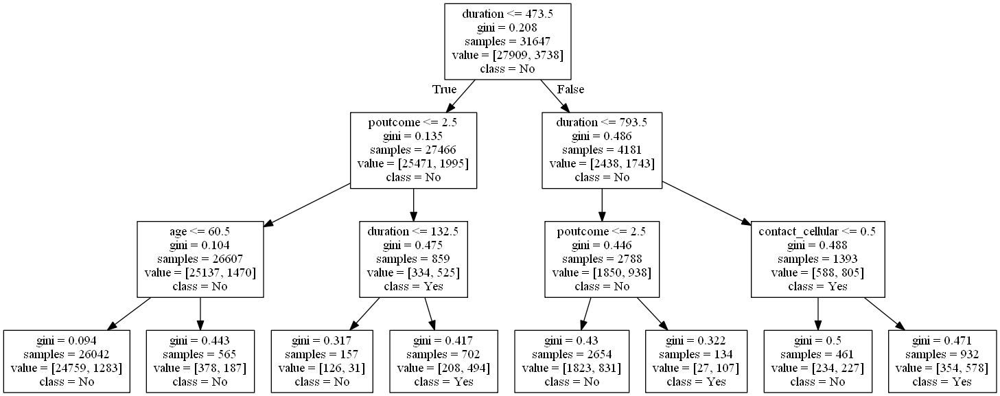

In [ ]:
retCode = system("dot -Tpng gini_tree_pruned.dot -o gini_tree_pruned.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("gini_tree_pruned.png"))

In [ ]:
Y_predict = DT_Gini_pruned.predict(X_test)


In [ ]:
cmDT_GINI = confusion_matrix(Y_test,Y_predict)
cmDT_GINI

array([[11749,   264],
       [ 1066,   485]], dtype=int64)

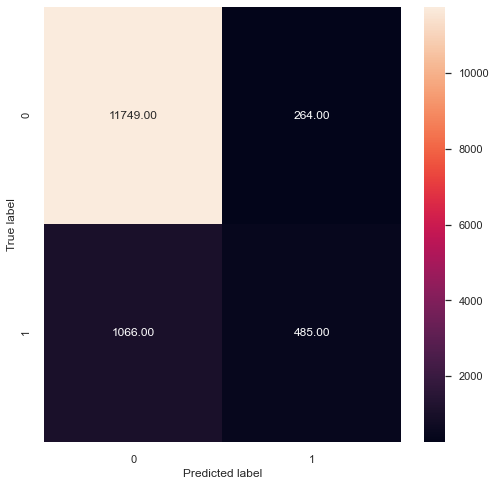

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y_test, Y_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_DTG=round(accuracy_score(Y_test,Y_predict)*100,2)
Rec_DTG=round(recall_score(Y_test,Y_predict)*100,2)
Prec_DTG=round(precision_score(Y_test,Y_predict)*100,2)
F1_DTG=round(f1_score(Y_test,Y_predict)*100,2)
ROC_DTG=round(roc_auc_score(Y_test,Y_predict)*100,2)

print("MODEL DT GINI : Accuracy Score :",Acc_DTG)
print()
print("MODEL DT GINI : Recall / Sensitivity % :",Rec_DTG)
print()
print("MODEL DT GINI: Precision % :",Prec_DTG)
print()
print("MODEL DT GINI: F1 Score % :",F1_DTG)
print()
print("MODEL DT GINI: Roc Auc Score % :",ROC_DTG)

MODEL DT GINI : Accuracy Score : 90.19

MODEL DT GINI : Recall / Sensitivity % : 31.27

MODEL DT GINI: Precision % : 64.75

MODEL DT GINI: F1 Score % : 42.17

MODEL DT GINI: Roc Auc Score % : 64.54


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison

tempRawResultsDf = pd.DataFrame({'method':['Decision Tree Gini Pruned'], 
                              'accuracy': Acc_DTG,
                              'recall':Rec_DTG, 
                              'precision':Prec_DTG, 
                              'f1':F1_DTG, 
                              'roc':ROC_DTG
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54


## Decision Tree with ENTROPY

In [ ]:
DT_Ent = DecisionTreeClassifier(criterion = 'entropy', random_state=1) # No pruning...full grown DT
DT_Ent.fit(X_train, Y_train)

DecisionTreeClassifier(criterion='entropy', random_state=1)

In [ ]:
print(DT_Ent.score(X_train, Y_train))
print(DT_Ent.score(X_test, Y_test))

1.0
0.8759215570628134


In [ ]:
train_char_label = ['No', 'Yes']
entr_tree_file = open('entr_tree_file.dot','w')
dot_data = tree.export_graphviz(DT_Ent, out_file=entr_tree_file, feature_names = list(X_train), class_names = list(train_char_label))
entr_tree_file.close()

In [ ]:
retCode = system("dot -Tpng entr_tree_file.dot -o entropy_tree.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("entropy_tree.png"))

In [ ]:
# need to prune
DT_Ent_pruned = DecisionTreeClassifier(criterion = 'entropy', random_state=1, max_depth=3) # pruning...shallow DT
DT_Ent_pruned.fit(X_train, Y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=1)

In [ ]:
print(DT_Ent_pruned.score(X_train, Y_train))
print(DT_Ent_pruned.score(X_test, Y_test))

0.8997693304262647
0.9014302565614863


In [ ]:
train_char_label = ['No', 'Yes']
ent_tree_pruned_file = open('ent_tree_pruned.dot','w')
dot_data = tree.export_graphviz(DT_Ent_pruned, out_file=ent_tree_pruned_file, feature_names = list(X_train), class_names = list(train_char_label))
ent_tree_pruned_file.close()

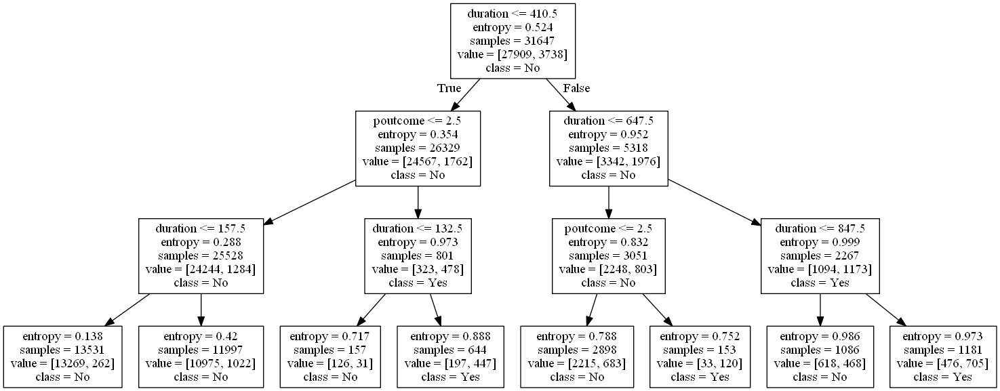

In [ ]:
retCode = system("dot -Tpng ent_tree_pruned.dot -o entropy_tree_pruned.png")
if(retCode>0):
    print("system command returning error: "+str(retCode))
else:
    display(Image("entropy_tree_pruned.png"))

In [ ]:
Y_predict = DT_Ent_pruned.predict(X_test)

In [ ]:
cmDT_Entropy = confusion_matrix(Y_test,Y_predict)
cmDT_Entropy

array([[11701,   312],
       [ 1025,   526]], dtype=int64)

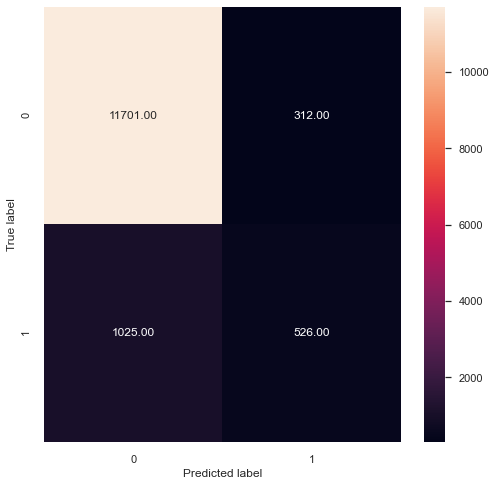

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y_test, Y_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_DTE=round(accuracy_score(Y_test,Y_predict)*100,2)
Rec_DTE=round(recall_score(Y_test,Y_predict)*100,2)
Prec_DTE=round(precision_score(Y_test,Y_predict)*100,2)
F1_DTE=round(f1_score(Y_test,Y_predict)*100,2)
ROC_DTE=round(roc_auc_score(Y_test,Y_predict)*100,2)

print("MODEL DT ENTROPY : Accuracy Score :",Acc_DTE)
print()
print("MODEL DT ENTROPY : Recall / Sensitivity % :",Rec_DTE)
print()
print("MODEL DT ENTROPY: Precision % :",Prec_DTE)
print()
print("MODEL DT ENTROPY: F1 Score % :",F1_DTE)
print()
print("MODEL DT ENTROPY: Roc Auc Score % :",ROC_DTE)

MODEL DT ENTROPY : Accuracy Score : 90.14

MODEL DT ENTROPY : Recall / Sensitivity % : 33.91

MODEL DT ENTROPY: Precision % : 62.77

MODEL DT ENTROPY: F1 Score % : 44.04

MODEL DT ENTROPY: Roc Auc Score % : 65.66


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison

tempRawResultsDf = pd.DataFrame({'method':['Decision Tree Entropy Pruned'], 
                              'accuracy': Acc_DTE,
                              'recall':Rec_DTE, 
                              'precision':Prec_DTE, 
                              'f1':F1_DTE, 
                              'roc':ROC_DTE
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66


### Let's look at the feature importance of both the DTs a) by gini b) by entropy

In [ ]:
## Calculating feature importance
print (pd.DataFrame(DT_Gini_pruned.feature_importances_, columns = ["Imp"], index = X_train.columns))

                          Imp
age                  0.051436
default              0.000000
balance              0.000000
housing              0.000000
loan                 0.000000
day                  0.000000
duration             0.606017
campaign             0.000000
pdays                0.000000
previous             0.000000
poutcome             0.336646
job_admin.           0.000000
job_blue-collar      0.000000
job_entrepreneur     0.000000
job_housemaid        0.000000
job_management       0.000000
job_retired          0.000000
job_self-employed    0.000000
job_services         0.000000
job_student          0.000000
job_technician       0.000000
job_unemployed       0.000000
job_unknown          0.000000
marital_divorced     0.000000
marital_married      0.000000
marital_single       0.000000
contact_cellular     0.005901
contact_telephone    0.000000
contact_unknown      0.000000
month_apr            0.000000
month_aug            0.000000
month_dec            0.000000
month_feb 

In [ ]:
pd.DataFrame(DT_Ent_pruned.feature_importances_, columns = ["Imp"], index = X_train.columns)

,Imp
age,0.000000
default,0.000000
balance,0.000000
housing,0.000000
loan,0.000000
day,0.000000
duration,0.692217
campaign,0.000000
pdays,0.000000
previous,0.000000


## RANDOM FOREST with 100 estimators (by default is gini and full depth)

In [ ]:
#randomforest
rfc = RandomForestClassifier(n_estimators = 100) 
rfc.fit(X_train, Y_train)

RandomForestClassifier()

In [ ]:
print(rfc.score(X_train, Y_train))
print(rfc.score(X_test, Y_test))

1.0
0.9071070480684164


In [ ]:
Y_predict = rfc.predict(X_test)

In [ ]:
cmRFC = confusion_matrix(Y_test,Y_predict)
cmRFC

array([[11675,   338],
       [  922,   629]], dtype=int64)

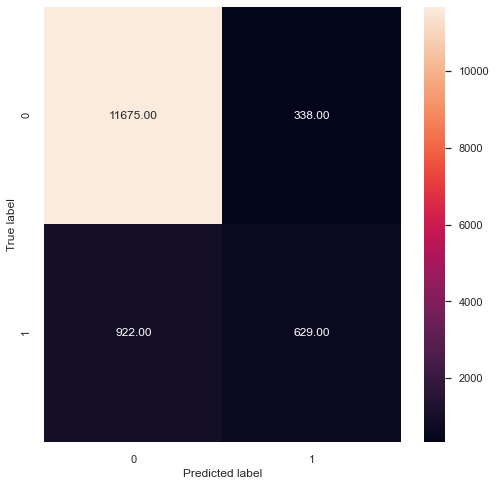

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y_test, Y_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_rfc=round(accuracy_score(Y_test,Y_predict)*100,2)
Rec_rfc=round(recall_score(Y_test,Y_predict)*100,2)
Prec_rfc=round(precision_score(Y_test,Y_predict)*100,2)
F1_rfc=round(f1_score(Y_test,Y_predict)*100,2)
ROC_rfc=round(roc_auc_score(Y_test,Y_predict)*100,2)

print("MODEL DT Random Forest GINI : Accuracy Score :",Acc_rfc)
print()
print("MODEL DT Random Forest GINI: Recall / Sensitivity % :",Rec_rfc)
print()
print("MODEL DT Random Forest GINI: Precision % :",Prec_rfc)
print()
print("MODEL DT Random Forest GINI: F1 Score % :",F1_rfc)
print()
print("MODEL DT Random Forest GINI: Roc Auc Score % :",ROC_rfc)

MODEL DT Random Forest GINI : Accuracy Score : 90.71

MODEL DT Random Forest GINI: Recall / Sensitivity % : 40.55

MODEL DT Random Forest GINI: Precision % : 65.05

MODEL DT Random Forest GINI: F1 Score % : 49.96

MODEL DT Random Forest GINI: Roc Auc Score % : 68.87


In [ ]:
#Store the accuracy results for each model in a dataframe for final comparison

tempRawResultsDf = pd.DataFrame({'method':['Random Forest'], 
                              'accuracy': Acc_rfc,
                              'recall':Rec_rfc, 
                              'precision':Prec_rfc, 
                              'f1':F1_rfc, 
                              'roc':ROC_rfc
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66
0,Random Forest,90.71,40.55,65.05,49.96,68.87


## RANDOM FOREST with 100 estimators and entropy criterion 

In [ ]:
#randomforest with entropy and depth
rfcE = RandomForestClassifier(criterion = 'entropy',n_estimators=100) 
rfcE.fit(X_train, Y_train)

RandomForestClassifier(criterion='entropy')

In [ ]:
print(rfcE.score(X_train, Y_train))
print(rfcE.score(X_test, Y_test))

1.0
0.9069595989383663


In [ ]:
Y_predict = rfcE.predict(X_test)

In [ ]:
cmRFCE = confusion_matrix(Y_test,Y_predict)
cmRFCE

array([[11706,   307],
       [  955,   596]], dtype=int64)

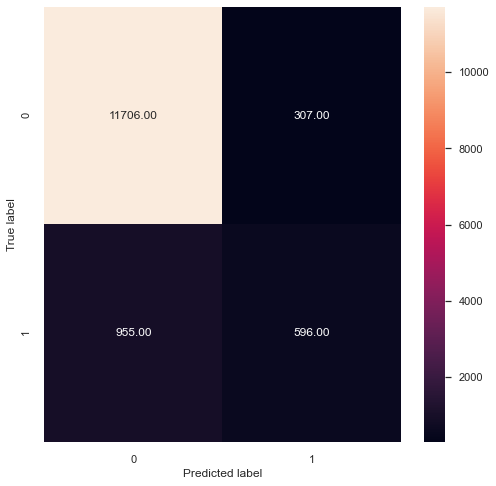

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y_test, Y_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_rfcE=round(accuracy_score(Y_test,Y_predict)*100,2)
Rec_rfcE=round(recall_score(Y_test,Y_predict)*100,2)
Prec_rfcE=round(precision_score(Y_test,Y_predict)*100,2)
F1_rfcE=round(f1_score(Y_test,Y_predict)*100,2)
ROC_rfcE=round(roc_auc_score(Y_test,Y_predict)*100,2)

print("MODEL DT Random Forest ENTROPY: Accuracy Score :",Acc_rfcE)
print()
print("MODEL DT Random Forest ENTROPY: Recall / Sensitivity % :",Rec_rfcE)
print()
print("MODEL DT Random Forest ENTROPY: Precision % :",Prec_rfcE)
print()
print("MODEL DT Random Forest ENTROPY: F1 Score % :",F1_rfcE)
print()
print("MODEL DT Random Forest ENTROPY: Roc Auc Score % :",ROC_rfcE)

MODEL DT Random Forest ENTROPY: Accuracy Score : 90.7

MODEL DT Random Forest ENTROPY: Recall / Sensitivity % : 38.43

MODEL DT Random Forest ENTROPY: Precision % : 66.0

MODEL DT Random Forest ENTROPY: F1 Score % : 48.57

MODEL DT Random Forest ENTROPY: Roc Auc Score % : 67.94


In [ ]:
tempRawResultsDf = pd.DataFrame({'method':['Random Forest Entropy'], 
                              'accuracy': Acc_rfcE,
                              'recall':Rec_rfcE, 
                              'precision':Prec_rfcE, 
                              'f1':F1_rfcE, 
                              'roc':ROC_rfcE
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94


## BAGGING

In [ ]:
X_train.shape

(31647, 45)

In [ ]:
bgc = BaggingClassifier(n_estimators=50, max_samples= .7, bootstrap=True, oob_score=True, random_state=65)
bgc.fit(X_train, Y_train)

BaggingClassifier(max_samples=0.7, n_estimators=50, oob_score=True,
                  random_state=65)

In [ ]:
print(bgc.score(X_train, Y_train))
print(bgc.score(X_test, Y_test))

0.9936170885075994
0.9091713358891182


In [ ]:
Y_predict = bgc.predict(X_test)

In [ ]:
cmbgc = confusion_matrix(Y_test,Y_predict)
cmbgc

array([[11568,   445],
       [  787,   764]], dtype=int64)

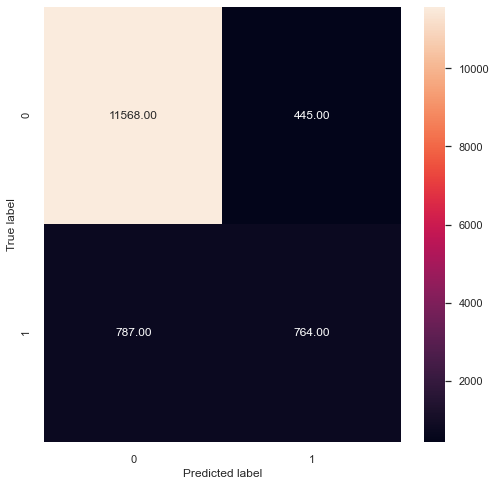

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y_test, Y_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_bgc=round(accuracy_score(Y_test,Y_predict)*100,2)
Rec_bgc=round(recall_score(Y_test,Y_predict)*100,2)
Prec_bgc=round(precision_score(Y_test,Y_predict)*100,2)
F1_bgc=round(f1_score(Y_test,Y_predict)*100,2)
ROC_bgc=round(roc_auc_score(Y_test,Y_predict)*100,2)

print("MODEL Bagging: Accuracy Score :",Acc_bgc)
print()
print("MODEL Bagging: Recall / Sensitivity % :",Rec_bgc)
print()
print("MODEL Bagging: Precision % :",Prec_bgc)
print()
print("MODEL Bagging: F1 Score % :",F1_bgc)
print()
print("MODEL Bagging: Roc Auc Score % :",ROC_bgc)

MODEL Bagging: Accuracy Score : 90.92

MODEL Bagging: Recall / Sensitivity % : 49.26

MODEL Bagging: Precision % : 63.19

MODEL Bagging: F1 Score % : 55.36

MODEL Bagging: Roc Auc Score % : 72.78


In [ ]:
tempRawResultsDf = pd.DataFrame({'method':['Bagging'], 
                              'accuracy': Acc_bgc,
                              'recall':Rec_bgc, 
                              'precision':Prec_bgc, 
                              'f1':F1_bgc, 
                              'roc':ROC_bgc
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Bagging,90.92,49.26,63.19,55.36,72.78


## ADABoost

In [ ]:
abc = AdaBoostClassifier(n_estimators = 20, random_state=65)
abc.fit(X_train, Y_train)

AdaBoostClassifier(n_estimators=20, random_state=65)

In [ ]:
print(abc.score(X_train, Y_train))
print(abc.score(X_test, Y_test))

0.8981894018390368
0.8984812739604836


In [ ]:
Y_predict = abc.predict(X_test)

In [ ]:
cmabc = confusion_matrix(Y_test,Y_predict)
cmabc

array([[11617,   396],
       [  981,   570]], dtype=int64)

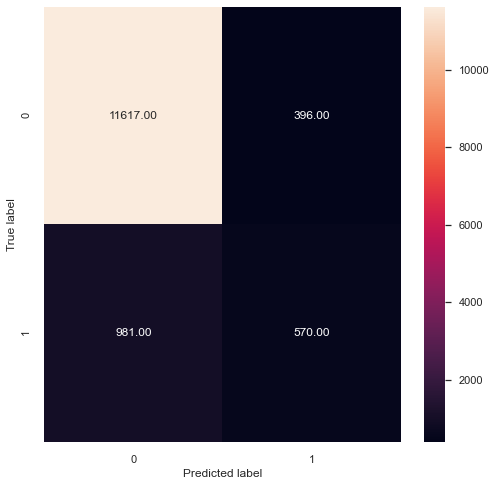

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y_test, Y_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_abc=round(accuracy_score(Y_test,Y_predict)*100,2)
Rec_abc=round(recall_score(Y_test,Y_predict)*100,2)
Prec_abc=round(precision_score(Y_test,Y_predict)*100,2)
F1_abc=round(f1_score(Y_test,Y_predict)*100,2)
ROC_abc=round(roc_auc_score(Y_test,Y_predict)*100,2)

print("MODEL ADABoost: Accuracy Score :",Acc_abc)
print()
print("MODEL ADABoost: Recall / Sensitivity % :",Rec_abc)
print()
print("MODEL ADABoost: Precision % :",Prec_abc)
print()
print("MODEL ADABoost: F1 Score % :",F1_abc)
print()
print("MODEL ADABoost: Roc Auc Score % :",ROC_abc)

MODEL ADABoost: Accuracy Score : 89.85

MODEL ADABoost: Recall / Sensitivity % : 36.75

MODEL ADABoost: Precision % : 59.01

MODEL ADABoost: F1 Score % : 45.29

MODEL ADABoost: Roc Auc Score % : 66.73


In [ ]:
tempRawResultsDf = pd.DataFrame({'method':['ADABoost'], 
                              'accuracy': Acc_abc,
                              'recall':Rec_abc, 
                              'precision':Prec_abc, 
                              'f1':F1_abc, 
                              'roc':ROC_abc
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Bagging,90.92,49.26,63.19,55.36,72.78
0,ADABoost,89.85,36.75,59.01,45.29,66.73


## GRADIENT BOOST

In [ ]:
gbc=GradientBoostingClassifier(n_estimators = 50)
gbc.fit(X_train, Y_train)

GradientBoostingClassifier(n_estimators=50)

In [ ]:
print(gbc.score(X_train, Y_train))
print(gbc.score(X_test, Y_test))

0.9071949947862357
0.9050427602477146


In [ ]:
Y_predict = gbc.predict(X_test)

In [ ]:
cmgbc = confusion_matrix(Y_test,Y_predict)
cmgbc

array([[11718,   295],
       [  993,   558]], dtype=int64)

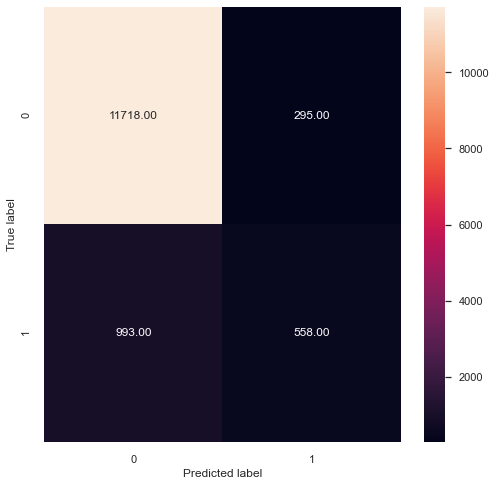

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y_test, Y_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_gbc=round(accuracy_score(Y_test,Y_predict)*100,2)
Rec_gbc=round(recall_score(Y_test,Y_predict)*100,2)
Prec_gbc=round(precision_score(Y_test,Y_predict)*100,2)
F1_gbc=round(f1_score(Y_test,Y_predict)*100,2)
ROC_gbc=round(roc_auc_score(Y_test,Y_predict)*100,2)

print("MODEL Gradient: Accuracy Score :",Acc_gbc)
print()
print("MODEL Gradient: Recall / Sensitivity % :",Rec_gbc)
print()
print("MODEL Gradient: Precision % :",Prec_gbc)
print()
print("MODEL Gradient: F1 Score % :",F1_gbc)
print()
print("MODEL Gradient: Roc Auc Score % :",ROC_gbc)

MODEL Gradient: Accuracy Score : 90.5

MODEL Gradient: Recall / Sensitivity % : 35.98

MODEL Gradient: Precision % : 65.42

MODEL Gradient: F1 Score % : 46.42

MODEL Gradient: Roc Auc Score % : 66.76


In [ ]:
tempRawResultsDf = pd.DataFrame({'method':['Gradient'], 
                              'accuracy': Acc_gbc,
                              'recall':Rec_gbc, 
                              'precision':Prec_gbc, 
                              'f1':F1_gbc, 
                              'roc':ROC_gbc
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Bagging,90.92,49.26,63.19,55.36,72.78
0,ADABoost,89.85,36.75,59.01,45.29,66.73
0,Gradient,90.50,35.98,65.42,46.42,66.76


# END OF ENSEMBLE with raw data representation

## INFERENCE

### The above dataframe provides the ensemble of all the models along with their metrices. 

#### From the above ensemble with the given models, we see that :

   ##### - Bagging has high recall and high precision and hence a better F1 amongst its peers. The ROC is also high. 
   ##### - Although Random Forest Entropy (used criterion of Entropy) has higher precision than just RandomForest(with gini), the recall is compromised and hence the F1 is slightly lower. So, RandomForest with Entropy crietrion is next best.
   
### OVERALL: with the given raw dataset we see that the metrics have low value, probably due to how the data is collected with lots of outliers and also imbalanced Target (~88%-~12% split between the classes). First strategy was to use additional features from given dataset, but while collecting data additional independent features should be thought about for better prediction. My next strategy is to address outliers (either drop rows), drop columns, and also address the imbalance in Target 
    - 


# NEXT STEP:

### We will now TRY to treat the outliers in few numerical columns and save in a different DF and the the dataframe with the same estimator with/without removing outliers.

In [ ]:
X.describe(include="int64").T

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
default,45211.0,0.018027,0.133049,0.0,0.0,0.0,0.0,1.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
housing,45211.0,0.555838,0.496878,0.0,0.0,1.0,1.0,1.0
loan,45211.0,0.160226,0.366820,0.0,0.0,0.0,0.0,1.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


In [ ]:
# treatment of Outliers in bankDF

# For Numerical Features
# name, meaning, range of values observed, central values (mean and median), 
# standard deviation and quartiles, analysis of the body of distributions / tails, missing values, outliers.

for feature in ["balance", "duration", "campaign", "pdays", "previous"]: # Loop through outliers' treatment candidate
    if bankDF[feature].dtype == 'int64': # Only apply for columns with int64
        print("Feature is {0}".format(feature))
        print("******************")
        print("Mean is {0}".format(bankDF[feature].mean()))
        print("Median is {0}".format(bankDF[feature].median()))
        print("Skewness is {0}".format(bankDF[feature].skew()))
        print("Std is {0}".format(bankDF[feature].std()))
        print("Quartiles are \n{0}".format(bankDF[feature].quantile([0.25, 0.5, 0.75])))
        print("IQR is {0}".format(bankDF[feature].quantile(0.75)-bankDF[feature].quantile(0.25)))
        print('Max is {0}'.format(bankDF[feature].max()))
        print("Upper Whisker is {0}".format(bankDF[feature].quantile(0.75)+(bankDF[feature].quantile(0.75)-bankDF[feature].quantile(0.25))*1.5))
        print("Lower Whisker is {0}".format(bankDF[feature].quantile(0.25)-(bankDF[feature].quantile(0.75)-bankDF[feature].quantile(0.25))*1.5))
        print('Min is {0}'.format(bankDF[feature].min()))
        print("******************\n")

Feature is balance
******************
Mean is 1362.2720576850766
Median is 448.0
Skewness is 8.360308326166326
Std is 3044.7658291686002
Quartiles are 
0.25      72.0
0.50     448.0
0.75    1428.0
Name: balance, dtype: float64
IQR is 1356.0
Max is 102127
Upper Whisker is 3462.0
Lower Whisker is -1962.0
Min is -8019
******************

Feature is duration
******************
Mean is 258.1630797814691
Median is 180.0
Skewness is 3.144318099423456
Std is 257.52781226517095
Quartiles are 
0.25    103.0
0.50    180.0
0.75    319.0
Name: duration, dtype: float64
IQR is 216.0
Max is 4918
Upper Whisker is 643.0
Lower Whisker is -221.0
Min is 0
******************

Feature is campaign
******************
Mean is 2.763840658246887
Median is 2.0
Skewness is 4.898650166179674
Std is 3.0980208832802205
Quartiles are 
0.25    1.0
0.50    2.0
0.75    3.0
Name: campaign, dtype: float64
IQR is 2.0
Max is 63
Upper Whisker is 6.0
Lower Whisker is -2.0
Min is 1
******************

Feature is pdays
**********

In [ ]:
# Impact of outliers for numerical values to the Target

print('Target counts', bankDF['Target'].value_counts(normalize=True)*100)
print()
print('upper balance \n', pd.crosstab(bankDF['balance']>3462,bankDF['Target']))
print()
print('lowerbalance \n', pd.crosstab(bankDF['balance']<-1962,bankDF['Target']))
print()
print('duration \n', pd.crosstab(bankDF['duration']>643,bankDF['Target']))
print()
print('campaign \n', pd.crosstab(bankDF['campaign']>6,bankDF['Target']))
print()
bankDF.pdays.value_counts()
print()
print('pdays \n', pd.crosstab(bankDF['pdays']==-1,bankDF['Target']))
print()
print('previous \n', pd.crosstab(bankDF['previous']>0,bankDF['Target']))

Target counts 0    88.30152
1    11.69848
Name: Target, dtype: float64

upper balance 
 Target       0     1
balance             
False    35976  4523
True      3946   766

lowerbalance 
 Target       0     1
balance             
False    39906  5288
True        16     1

duration 
 Target        0     1
duration             
False     38338  3638
True       1584  1651

campaign 
 Target        0     1
campaign             
False     37019  5128
True       2903   161


pdays 
 Target      0     1
pdays              
False    6352  1905
True    33570  3384

previous 
 Target        0     1
previous             
False     33570  3384
True       6352  1905


In [ ]:
# How many Targets with values 1 for values in candidate numerical columns > upper whiskers
print('Target counts', bankDF['Target'].value_counts())
print()
print('Upper Balance : ', pd.crosstab(bankDF['balance']>3462, bankDF['Target']==1)[1][1])
print('Lower Balance : ', pd.crosstab(bankDF['balance']<-1962, bankDF['Target']==1)[1][1])
print('Duration : ', pd.crosstab(bankDF['duration']>643, bankDF['Target']==1)[1][1])
print('Campaign : ', pd.crosstab(bankDF['campaign']>6, bankDF['Target']==1)[1][1])
print('Pdays : ', pd.crosstab(bankDF['pdays']>-1, bankDF['Target']==1)[1][1])
print('previous : ', pd.crosstab(bankDF['previous']>0, bankDF['Target']==1)[1][1])

Target counts 0    39922
1     5289
Name: Target, dtype: int64

Upper Balance :  766
Lower Balance :  1
Duration :  1651
Campaign :  161
Pdays :  1905
previous :  1905


## INFERENCE after outlier check : 
###  Based on above as the total Target counts (with =1) is just 5289, it is not advisable to remove outliers for Upper Balance, Duration, Pdays..it will further imbalance the Target. Campaign and balance (in negative) can be done, but there won't be much impact. Also, we can drop one of the columns Pdays or Previous - as based on earlier queries - their behavior is almost same. We will drop Pdays as it has negative values.

In [ ]:
bankDF1=bankDF.drop('pdays', axis=1)

In [ ]:
bankDF.shape, bankDF1.shape

((45211, 46), (45211, 45))

In [ ]:
# we will split the Target to a separate DF
X1 = bankDF1.drop('Target', axis=1)
Y1 = bankDF1['Target']

In [ ]:
X1.shape, Y1.shape, X1.dtypes, Y1.dtypes

((45211, 44),
 (45211,),
 age                    int64
 default                int64
 balance                int64
 housing                int64
 loan                   int64
 day                    int64
 duration               int64
 campaign               int64
 previous               int64
 poutcome               int64
 job_admin.             uint8
 job_blue-collar        uint8
 job_entrepreneur       uint8
 job_housemaid          uint8
 job_management         uint8
 job_retired            uint8
 job_self-employed      uint8
 job_services           uint8
 job_student            uint8
 job_technician         uint8
 job_unemployed         uint8
 job_unknown            uint8
 marital_divorced       uint8
 marital_married        uint8
 marital_single         uint8
 contact_cellular       uint8
 contact_telephone      uint8
 contact_unknown        uint8
 month_apr              uint8
 month_aug              uint8
 month_dec              uint8
 month_feb              uint8
 month_jan     

In [ ]:
# Train : Test :: 70:30
X1_train, X1_test, Y1_train, Y1_test = train_test_split(X1, Y1, test_size=0.30,random_state=2)

In [ ]:
X1_train.shape, X1_test.shape, Y1_train.shape, Y1_test.shape

((31647, 44), (13564, 44), (31647,), (13564,))

In [ ]:
Y1_train.value_counts(normalize=True)*100
Y1_test.value_counts(normalize=True)*100

# This is a problem as case of Imbalance Data.

0    88.462106
1    11.537894
Name: Target, dtype: float64

### Before doing any correction to balance the Target(Y1) - I am checking the dataset without the balance and how predictions are. I am going to take bagging and RFw/entropy as these were the best performers with raw data.

### Bagging

In [ ]:
bgc1 = BaggingClassifier(n_estimators=50, max_samples= .7, bootstrap=True, oob_score=True, random_state=66)
bgc1.fit(X1_train, Y1_train)

BaggingClassifier(max_samples=0.7, n_estimators=50, oob_score=True,
                  random_state=66)

In [ ]:
print(bgc1.score(X1_train, Y1_train))
print(bgc1.score(X1_test, Y1_test))

0.9939962713685342
0.9041580654674137


In [ ]:
Y1_predict = bgc1.predict(X1_test)

In [ ]:
cmbgc1 = confusion_matrix(Y1_test,Y1_predict)
cmbgc1

array([[11542,   457],
       [  843,   722]], dtype=int64)

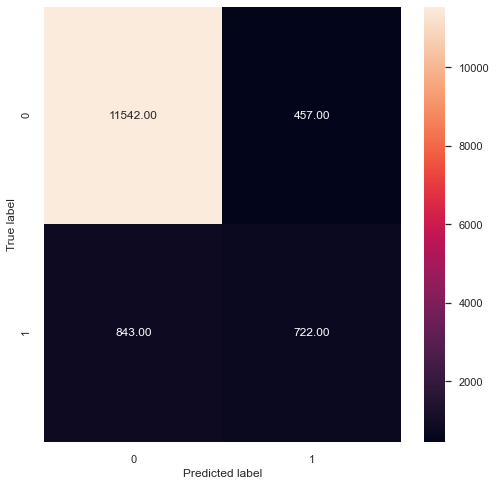

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y1_test, Y1_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_bgc1=round(accuracy_score(Y1_test,Y1_predict)*100,2)
Rec_bgc1=round(recall_score(Y1_test,Y1_predict)*100,2)
Prec_bgc1=round(precision_score(Y1_test,Y1_predict)*100,2)
F1_bgc1=round(f1_score(Y1_test,Y1_predict)*100,2)
ROC_bgc1=round(roc_auc_score(Y1_test,Y1_predict)*100,2)

print("MODEL Bagging: Accuracy Score :",Acc_bgc1)
print()
print("MODEL Bagging: Recall / Sensitivity % :",Rec_bgc1)
print()
print("MODEL Bagging: Precision % :",Prec_bgc1)
print()
print("MODEL Bagging: F1 Score % :",F1_bgc1)
print()
print("MODEL Bagging: Roc Auc Score % :",ROC_bgc1)

MODEL Bagging: Accuracy Score : 90.42

MODEL Bagging: Recall / Sensitivity % : 46.13

MODEL Bagging: Precision % : 61.24

MODEL Bagging: F1 Score % : 52.62

MODEL Bagging: Roc Auc Score % : 71.16


In [ ]:
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Bagging,90.92,49.26,63.19,55.36,72.78
0,ADABoost,89.85,36.75,59.01,45.29,66.73
0,Gradient,90.50,35.98,65.42,46.42,66.76


In [ ]:
tempRawResultsDf = pd.DataFrame({'method':['Bagging after Data Trmnt'], 
                              'accuracy': Acc_bgc1,
                              'recall':Rec_bgc1, 
                              'precision':Prec_bgc1, 
                              'f1':F1_bgc1, 
                              'roc':ROC_bgc1
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Bagging,90.92,49.26,63.19,55.36,72.78
0,ADABoost,89.85,36.75,59.01,45.29,66.73
0,Gradient,90.50,35.98,65.42,46.42,66.76
0,Bagging after Data Trmnt,90.42,46.13,61.24,52.62,71.16


### RandomForest with entropy

In [ ]:
#randomforest with entropy and depth
rfcE1 = RandomForestClassifier(criterion = 'entropy',n_estimators=100) 
rfcE1.fit(X1_train, Y1_train)

RandomForestClassifier(criterion='entropy')

In [ ]:
print(rfcE1.score(X1_train, Y1_train))
print(rfcE1.score(X1_test, Y1_test))

0.9999684014282555
0.9047478619876143


In [ ]:
Y1_predict = rfcE1.predict(X1_test)

In [ ]:
cmRFCE1 = confusion_matrix(Y1_test,Y1_predict)
cmRFCE1

array([[11683,   316],
       [  976,   589]], dtype=int64)

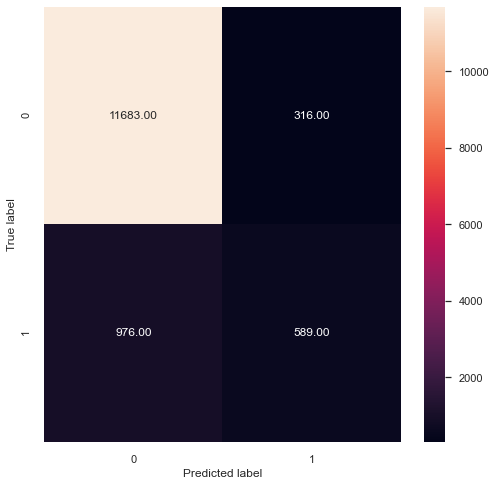

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y1_test, Y1_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_rfcE1=round(accuracy_score(Y1_test,Y1_predict)*100,2)
Rec_rfcE1=round(recall_score(Y1_test,Y1_predict)*100,2)
Prec_rfcE1=round(precision_score(Y1_test,Y1_predict)*100,2)
F1_rfcE1=round(f1_score(Y1_test,Y1_predict)*100,2)
ROC_rfcE1=round(roc_auc_score(Y1_test,Y1_predict)*100,2)

print("MODEL DT Random Forest ENTROPY after data trmt: Accuracy Score :",Acc_rfcE1)
print()
print("MODEL DT Random Forest ENTROPY: Recall / Sensitivity % :",Rec_rfcE1)
print()
print("MODEL DT Random Forest ENTROPY: Precision % :",Prec_rfcE1)
print()
print("MODEL DT Random Forest ENTROPY: F1 Score % :",F1_rfcE1)
print()
print("MODEL DT Random Forest ENTROPY: Roc Auc Score % :",ROC_rfcE1)

MODEL DT Random Forest ENTROPY after data trmt: Accuracy Score : 90.47

MODEL DT Random Forest ENTROPY: Recall / Sensitivity % : 37.64

MODEL DT Random Forest ENTROPY: Precision % : 65.08

MODEL DT Random Forest ENTROPY: F1 Score % : 47.69

MODEL DT Random Forest ENTROPY: Roc Auc Score % : 67.5


In [ ]:
tempRawResultsDf = pd.DataFrame({'method':['Random Forest Entropy after data trmt'], 
                              'accuracy': Acc_rfcE1,
                              'recall':Rec_rfcE1, 
                              'precision':Prec_rfcE1, 
                              'f1':F1_rfcE1, 
                              'roc':ROC_rfcE1
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Bagging,90.92,49.26,63.19,55.36,72.78
0,ADABoost,89.85,36.75,59.01,45.29,66.73
0,Gradient,90.50,35.98,65.42,46.42,66.76
0,Bagging after Data Trmnt,90.42,46.13,61.24,52.62,71.16
0,Random Forest Entropy after data trmt,90.47,37.64,65.08,47.69,67.50


### Inference : by dropping one of the column - there isn't much change in fact a slight decrease in our best algorithms that we found from using just the raw dataset.

### 'Target' output is imbalanced with 89% of the data with No and 11% of the data with Yes. Need to be balanced.

In [ ]:
#SMOTE (This is not in the lectures but the trainer mentioned during the Mentored Learning Session - so trying this
# so trying this out based on inputs recd from Andew and references provided

from imblearn.over_sampling import SMOTE

In [ ]:
# we will split the Target to a separate DF - we will use the original dataset. (without dropping pdays)
X2 = bankDF.drop('Target', axis=1)
Y2 = bankDF['Target']

In [ ]:
X2.shape, Y2.shape

((45211, 45), (45211,))

In [ ]:
# Train : Test :: 70:30
X2_train, X2_test, Y2_train, Y2_test = train_test_split(X2, Y2, test_size=0.30,random_state=3)

In [ ]:
smote= SMOTE()

In [ ]:
X2_train, Y2_train = smote.fit_sample(X2_train, Y2_train) # smote only TRAINING data

In [ ]:
X2_train.shape, Y2_train.shape

((55906, 45), (55906,))

In [ ]:
X2_train.shape, X2_test.shape, Y2_train.shape, Y2_test.shape

((55906, 45), (13564, 45), (55906,), (13564,))

In [ ]:
print(Y2_train.value_counts(normalize=True)*100)
print(Y2_test.value_counts(normalize=True)*100)


1    50.0
0    50.0
Name: Target, dtype: float64
0    88.240932
1    11.759068
Name: Target, dtype: float64


#### We now have equal class representation in Training data. We will keep the testing data class as original and not SMOTE it.

#### Like before we will use Bagging and RF w/Entropy to evaluate the data transforms.

### Bagging

In [ ]:
bgc2 = BaggingClassifier(n_estimators=50, max_samples= .7, bootstrap=True, oob_score=True, random_state=67)
bgc2.fit(X2_train, Y2_train)

BaggingClassifier(max_samples=0.7, n_estimators=50, oob_score=True,
                  random_state=67)

In [ ]:
print(bgc2.score(X2_train, Y2_train))
print(bgc2.score(X2_test, Y2_test))

0.9967445354702537
0.9001769389560602


In [ ]:
Y2_predict = bgc2.predict(X2_test)

In [ ]:
cmbgc2 = confusion_matrix(Y2_test,Y2_predict)
cmbgc2

array([[11373,   596],
       [  758,   837]], dtype=int64)

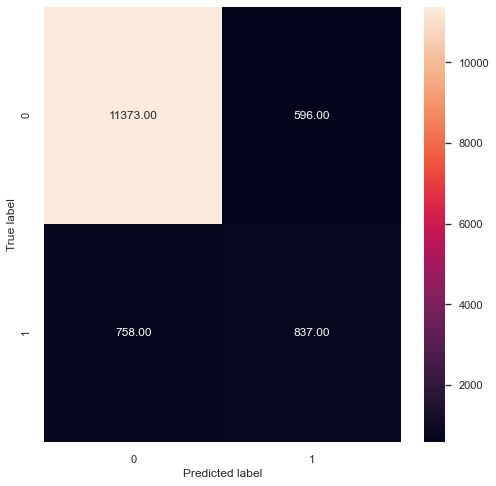

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y2_test, Y2_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_bgc2=round(accuracy_score(Y2_test,Y2_predict)*100,2)
Rec_bgc2=round(recall_score(Y2_test,Y2_predict)*100,2)
Prec_bgc2=round(precision_score(Y2_test,Y2_predict)*100,2)
F1_bgc2=round(f1_score(Y2_test,Y2_predict)*100,2)
ROC_bgc2=round(roc_auc_score(Y2_test,Y2_predict)*100,2)

print("MODEL Bagging: Accuracy Score :",Acc_bgc2)
print()
print("MODEL Bagging: Recall / Sensitivity % :",Rec_bgc2)
print()
print("MODEL Bagging: Precision % :",Prec_bgc2)
print()
print("MODEL Bagging: F1 Score % :",F1_bgc2)
print()
print("MODEL Bagging: Roc Auc Score % :",ROC_bgc2)

MODEL Bagging: Accuracy Score : 90.02

MODEL Bagging: Recall / Sensitivity % : 52.48

MODEL Bagging: Precision % : 58.41

MODEL Bagging: F1 Score % : 55.28

MODEL Bagging: Roc Auc Score % : 73.75


In [ ]:
tempRawResultsDf = pd.DataFrame({'method':['Bagging after SMOTE'], 
                              'accuracy': Acc_bgc2,
                              'recall':Rec_bgc2, 
                              'precision':Prec_bgc2, 
                              'f1':F1_bgc2, 
                              'roc':ROC_bgc2
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Bagging,90.92,49.26,63.19,55.36,72.78
0,ADABoost,89.85,36.75,59.01,45.29,66.73
0,Gradient,90.50,35.98,65.42,46.42,66.76
0,Bagging after Data Trmnt,90.42,46.13,61.24,52.62,71.16
0,Random Forest Entropy after data trmt,90.47,37.64,65.08,47.69,67.50


### Random Forest with Entropy

In [ ]:
X2_train.shape, Y2_train.shape, X2_test.shape, Y2_test.shape

((55906, 45), (55906,), (13564, 45), (13564,))

In [ ]:
#randomforest with entropy and depth
rfcE2 = RandomForestClassifier(criterion = 'entropy',n_estimators=100) 
rfcE2.fit(X2_train, Y2_train)

RandomForestClassifier(criterion='entropy')

In [ ]:
print(rfcE2.score(X2_train, Y2_train))
print(rfcE2.score(X2_test, Y2_test))

1.0
0.9054113830728399


In [ ]:
Y2_predict = rfcE2.predict(X2_test)

In [ ]:
cmRFCE2 = confusion_matrix(Y2_test,Y2_predict)
cmRFCE2

array([[11537,   432],
       [  851,   744]], dtype=int64)

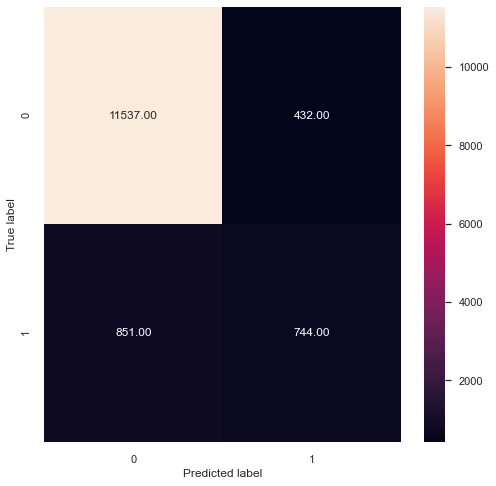

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y2_test, Y2_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_rfcE2=round(accuracy_score(Y2_test,Y2_predict)*100,2)
Rec_rfcE2=round(recall_score(Y2_test,Y2_predict)*100,2)
Prec_rfcE2=round(precision_score(Y2_test,Y2_predict)*100,2)
F1_rfcE2=round(f1_score(Y2_test,Y2_predict)*100,2)
ROC_rfcE2=round(roc_auc_score(Y2_test,Y2_predict)*100,2)

print("MODEL DT Random Forest ENTROPY after data trmt: Accuracy Score :",Acc_rfcE2)
print()
print("MODEL DT Random Forest ENTROPY: Recall / Sensitivity % :",Rec_rfcE2)
print()
print("MODEL DT Random Forest ENTROPY: Precision % :",Prec_rfcE2)
print()
print("MODEL DT Random Forest ENTROPY: F1 Score % :",F1_rfcE2)
print()
print("MODEL DT Random Forest ENTROPY: Roc Auc Score % :",ROC_rfcE2)

MODEL DT Random Forest ENTROPY after data trmt: Accuracy Score : 90.54

MODEL DT Random Forest ENTROPY: Recall / Sensitivity % : 46.65

MODEL DT Random Forest ENTROPY: Precision % : 63.27

MODEL DT Random Forest ENTROPY: F1 Score % : 53.7

MODEL DT Random Forest ENTROPY: Roc Auc Score % : 71.52


In [ ]:
tempRawResultsDf = pd.DataFrame({'method':['Random Forest with Entropy after SMOTE'], 
                              'accuracy': Acc_rfcE2,
                              'recall':Rec_rfcE2, 
                              'precision':Prec_rfcE2, 
                              'f1':F1_rfcE2, 
                              'roc':ROC_rfcE2
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Bagging,90.92,49.26,63.19,55.36,72.78
0,ADABoost,89.85,36.75,59.01,45.29,66.73
0,Gradient,90.50,35.98,65.42,46.42,66.76
0,Bagging after Data Trmnt,90.42,46.13,61.24,52.62,71.16
0,Random Forest Entropy after data trmt,90.47,37.64,65.08,47.69,67.50


In [ ]:
rawResultsDF.sort_values(by=['f1','roc', 'precision', 'recall', 'accuracy'],ascending=False)


,method,accuracy,recall,precision,f1,roc
0,Bagging,90.92,49.26,63.19,55.36,72.78
0,Bagging after SMOTE,90.02,52.48,58.41,55.28,73.75
0,Random Forest with Entropy after SMOTE,90.54,46.65,63.27,53.70,71.52
0,Bagging after Data Trmnt,90.42,46.13,61.24,52.62,71.16
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Random Forest Entropy after data trmt,90.47,37.64,65.08,47.69,67.50
0,Gradient,90.50,35.98,65.42,46.42,66.76
0,ADABoost,89.85,36.75,59.01,45.29,66.73
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66


# END of ENSEMBLE with output balancing using SMOTE

## INFERENCE

#### As we see from above tabular column, BAGGING and RandomForest seem to perform better. And Bagging with original dataset & Bagging with original dataet with balance Target seem to behave almost queally though the Bagging with original dataset has higher Precison but low recall. (the model is not able to detect the class well, but when it does is highly reliable). While after improving the Target synthetically, the bagging model is able to detect class slightly better but at cost of precision. So, the bagging without synthetic improvement seems the best for this dataset.

# NEXT STEP

## One Final step I want to check is to remove the outliers as mentioned earlier (for balance, duration, campaign) but use SMOTE for synthesizing Target.

In [ ]:
# treatment of Outliers in bankDF

# For Numerical Features
# name, meaning, range of values observed, central values (mean and median), 
# standard deviation and quartiles, analysis of the body of distributions / tails, missing values, outliers.

for feature in ["balance", "duration", "campaign", "pdays", "previous"]: # Loop through outliers' treatment candidate
    if bankDF[feature].dtype == 'int64': # Only apply for columns with int64
        print("Feature is {0}".format(feature))
        print("******************")
        print("Mean is {0}".format(bankDF[feature].mean()))
        print("Median is {0}".format(bankDF[feature].median()))
        print("Skewness is {0}".format(bankDF[feature].skew()))
        print("Std is {0}".format(bankDF[feature].std()))
        print("Quartiles are \n{0}".format(bankDF[feature].quantile([0.25, 0.5, 0.75])))
        print("IQR is {0}".format(bankDF[feature].quantile(0.75)-bankDF[feature].quantile(0.25)))
        print('Max is {0}'.format(bankDF[feature].max()))
        print("Upper Whisker is {0}".format(bankDF[feature].quantile(0.75)+(bankDF[feature].quantile(0.75)-bankDF[feature].quantile(0.25))*1.5))
        print("Lower Whisker is {0}".format(bankDF[feature].quantile(0.25)-(bankDF[feature].quantile(0.75)-bankDF[feature].quantile(0.25))*1.5))
        print('Min is {0}'.format(bankDF[feature].min()))
        print("******************\n")

Feature is balance
******************
Mean is 1362.2720576850766
Median is 448.0
Skewness is 8.360308326166326
Std is 3044.7658291686002
Quartiles are 
0.25      72.0
0.50     448.0
0.75    1428.0
Name: balance, dtype: float64
IQR is 1356.0
Max is 102127
Upper Whisker is 3462.0
Lower Whisker is -1962.0
Min is -8019
******************

Feature is duration
******************
Mean is 258.1630797814691
Median is 180.0
Skewness is 3.144318099423456
Std is 257.52781226517095
Quartiles are 
0.25    103.0
0.50    180.0
0.75    319.0
Name: duration, dtype: float64
IQR is 216.0
Max is 4918
Upper Whisker is 643.0
Lower Whisker is -221.0
Min is 0
******************

Feature is campaign
******************
Mean is 2.763840658246887
Median is 2.0
Skewness is 4.898650166179674
Std is 3.0980208832802205
Quartiles are 
0.25    1.0
0.50    2.0
0.75    3.0
Name: campaign, dtype: float64
IQR is 2.0
Max is 63
Upper Whisker is 6.0
Lower Whisker is -2.0
Min is 1
******************

Feature is pdays
**********

In [ ]:
#Take the upper/lower whisker values where applicable and remove rows above/below them.

print('Target counts', bankDF['Target'].value_counts(normalize=True)*100)
print()
print('upper balance \n', pd.crosstab(bankDF['balance']>3462,bankDF['Target']))
print()
print('lowerbalance \n', pd.crosstab(bankDF['balance']<-1962,bankDF['Target']))
print()
print('duration \n', pd.crosstab(bankDF['duration']>643,bankDF['Target']))
print()
print('campaign \n', pd.crosstab(bankDF['campaign']>6,bankDF['Target']))
print()
bankDF.pdays.value_counts()
print()
print('pdays \n', pd.crosstab(bankDF['pdays']!=-1,bankDF['Target']))
print()
print('previous \n', pd.crosstab(bankDF['previous']!=0,bankDF['Target']))

Target counts 0    88.30152
1    11.69848
Name: Target, dtype: float64

upper balance 
 Target       0     1
balance             
False    35976  4523
True      3946   766

lowerbalance 
 Target       0     1
balance             
False    39906  5288
True        16     1

duration 
 Target        0     1
duration             
False     38338  3638
True       1584  1651

campaign 
 Target        0     1
campaign             
False     37019  5128
True       2903   161


pdays 
 Target      0     1
pdays              
False   33570  3384
True     6352  1905

previous 
 Target        0     1
previous             
False     33570  3384
True       6352  1905


In [ ]:
bankDF2=bankDF.copy()

In [ ]:
bankDF2.shape

(45211, 46)

In [ ]:
# This removes upper outliers for balance
bankDF2=bankDF2[(bankDF2['balance']>=-1962)&(bankDF2['balance']<=3462)]

In [ ]:
bankDF2.shape

(40482, 46)

In [ ]:
print('Target counts', bankDF2['Target'].value_counts(normalize=True)*100)
print()
print('Target counts', bankDF2['Target'].value_counts())#(normalize=True)*100)
print()
print('upper balance \n', pd.crosstab(bankDF2['balance']>3462,bankDF2['Target']))
print()
print('lowerbalance \n', pd.crosstab(bankDF2['balance']<-1962,bankDF2['Target']))
print()
print("Removes the outliers in balance")

Target counts 0    88.829603
1    11.170397
Name: Target, dtype: float64

Target counts 0    35960
1     4522
Name: Target, dtype: int64

upper balance 
 Target       0     1
balance             
False    35960  4522

lowerbalance 
 Target       0     1
balance             
False    35960  4522

Removes the outliers in balance


In [ ]:
print('Target counts', bankDF2['Target'].value_counts(normalize=True)*100)
print()
print('Target counts', bankDF2['Target'].value_counts())
print()
print("before removal outliers in duration")
print()
print('duration \n', pd.crosstab(bankDF2['duration']>643,bankDF2['Target']))
print()


Target counts 0    88.829603
1    11.170397
Name: Target, dtype: float64

Target counts 0    35960
1     4522
Name: Target, dtype: int64

before removal outliers in duration

duration 
 Target        0     1
duration             
False     34557  3102
True       1403  1420



In [ ]:
# This removes upper outliers for duration
bankDF2=bankDF2[bankDF2['duration']<=643]

In [ ]:
bankDF2.shape

(37659, 46)

In [ ]:
print('Target counts', bankDF2['Target'].value_counts(normalize=True)*100)
print()
print('Target counts', bankDF2['Target'].value_counts())
print()
print("after removal in duration")
print()
print('duration \n', pd.crosstab(bankDF2['duration']>643,bankDF2['Target']))
print()

Target counts 0    91.762925
1     8.237075
Name: Target, dtype: float64

Target counts 0    34557
1     3102
Name: Target, dtype: int64

after removal in duration

duration 
 Target        0     1
duration             
False     34557  3102



In [ ]:
print('Target counts', bankDF2['Target'].value_counts(normalize=True)*100)
print()
print('Target counts', bankDF2['Target'].value_counts())
print()
print("before removal outliers in campaign")
print()
print('campaign \n', pd.crosstab(bankDF2['campaign']>6,bankDF2['Target']))
print()


Target counts 0    91.762925
1     8.237075
Name: Target, dtype: float64

Target counts 0    34557
1     3102
Name: Target, dtype: int64

before removal outliers in campaign

campaign 
 Target        0     1
campaign             
False     32008  3043
True       2549    59



In [ ]:
# This removes upper outliers for campaign
bankDF2=bankDF2[bankDF2['campaign']<=6]

In [ ]:
bankDF2.shape

(35051, 46)

In [ ]:
print('Target counts', bankDF2['Target'].value_counts(normalize=True)*100)
print()
print('Target counts', bankDF2['Target'].value_counts())
print()
print(" after outliers in campaign")
print()
print('campaign \n', pd.crosstab(bankDF2['campaign']>6,bankDF2['Target']))
print()


Target counts 0    91.318365
1     8.681635
Name: Target, dtype: float64

Target counts 0    32008
1     3043
Name: Target, dtype: int64

 after outliers in campaign

campaign 
 Target        0     1
campaign             
False     32008  3043



In [ ]:
print('Target counts', bankDF2['Target'].value_counts(normalize=True)*100)
print()
print('Target counts', bankDF2['Target'].value_counts())
print()
print(" before outliers in pdays")
print()
print('campaign \n', pd.crosstab(bankDF2['pdays']!=-1,bankDF2['Target']))
print()

Target counts 0    91.318365
1     8.681635
Name: Target, dtype: float64

Target counts 0    32008
1     3043
Name: Target, dtype: int64

 before outliers in pdays

campaign 
 Target      0     1
pdays              
False   26721  1686
True     5287  1357



In [ ]:
# This removes  outliers for pdays
bankDF2=bankDF2[bankDF2['pdays']==-1]

In [ ]:
bankDF2.shape

(28407, 46)

In [ ]:
print('Target counts', bankDF2['Target'].value_counts(normalize=True)*100)
print()
print('Target counts', bankDF2['Target'].value_counts())
print()
print(" after outliers in pdays")
print()
print('pdays \n', pd.crosstab(bankDF2['pdays']!=-1,bankDF2['Target']))
print()

Target counts 0    94.064843
1     5.935157
Name: Target, dtype: float64

Target counts 0    26721
1     1686
Name: Target, dtype: int64

 after outliers in pdays

pdays 
 Target      0     1
pdays              
False   26721  1686



In [ ]:
print('Target counts', bankDF2['Target'].value_counts(normalize=True)*100)
print()
print('Target counts', bankDF2['Target'].value_counts())
print()
print(" before outliers in previous")
print()
print('campaign \n', pd.crosstab(bankDF2['previous']>0,bankDF2['Target']))
print()

Target counts 0    94.064843
1     5.935157
Name: Target, dtype: float64

Target counts 0    26721
1     1686
Name: Target, dtype: int64

 before outliers in previous

campaign 
 Target        0     1
previous             
False     26721  1686



#### Note here, removing outliers in pdays removes outliers in previous.

In [ ]:
bankDF2.shape

(28407, 46)

### Start Splitting the data to train and test. And then do SMOTE of train

In [ ]:
# we will split the Target to a separate DF - we will use the original dataset. (without dropping pdays)
X3= bankDF2.drop('Target', axis=1)
Y3 = bankDF2['Target']

In [ ]:
X3.shape, Y3.shape

((28407, 45), (28407,))

In [ ]:
# Train : Test :: 70:30
X3_train, X3_test, Y3_train, Y3_test = train_test_split(X3, Y3, test_size=0.30,random_state=4)

In [ ]:
smote1= SMOTE()

In [ ]:
X3_train, Y3_train = smote1.fit_sample(X3_train, Y3_train) # smote only TRAINING data

In [ ]:
X3_train.shape, Y3_train.shape

((37422, 45), (37422,))

In [ ]:
X3_train.shape, X3_test.shape, Y3_train.shape, Y3_test.shape

((37422, 45), (8523, 45), (37422,), (8523,))

In [ ]:
print(Y3_train.value_counts(normalize=True)*100)
print(Y3_test.value_counts(normalize=True)*100)

1    50.0
0    50.0
Name: Target, dtype: float64
0    93.980993
1     6.019007
Name: Target, dtype: float64


#### We now have equal class representation in Training data. We will keep the testing data class as original and not SMOTE it.

#### Like before we will use Bagging and RF w/Entropy to evaluate the data transforms.

### Bagging

In [ ]:
bgc3 = BaggingClassifier(n_estimators=50, max_samples= .7, bootstrap=True, oob_score=True, random_state=67)
bgc3.fit(X3_train, Y3_train)

BaggingClassifier(max_samples=0.7, n_estimators=50, oob_score=True,
                  random_state=67)

In [ ]:
print(bgc3.score(X3_train, Y3_train))
print(bgc3.score(X3_test, Y3_test))

0.9973544973544973
0.9378153232429896


In [ ]:
Y3_predict = bgc3.predict(X3_test)

In [ ]:
cmbgc3 = confusion_matrix(Y3_test,Y3_predict)
cmbgc3

array([[7821,  189],
       [ 341,  172]], dtype=int64)

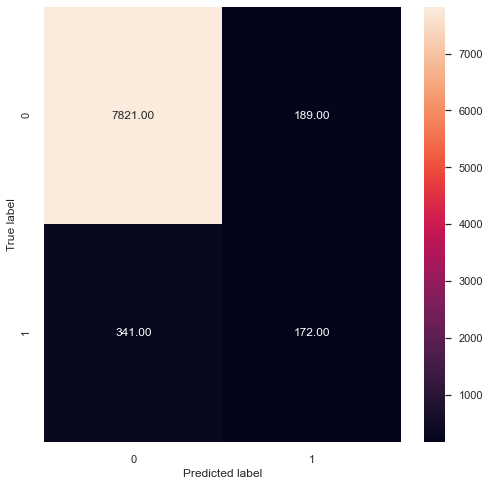

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y3_test, Y3_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_bgc3=round(accuracy_score(Y3_test,Y3_predict)*100,2)
Rec_bgc3=round(recall_score(Y3_test,Y3_predict)*100,2)
Prec_bgc3=round(precision_score(Y3_test,Y3_predict)*100,2)
F1_bgc3=round(f1_score(Y3_test,Y3_predict)*100,2)
ROC_bgc3=round(roc_auc_score(Y3_test,Y3_predict)*100,2)

print("MODEL Bagging: Accuracy Score :",Acc_bgc3)
print()
print("MODEL Bagging: Recall / Sensitivity % :",Rec_bgc3)
print()
print("MODEL Bagging: Precision % :",Prec_bgc3)
print()
print("MODEL Bagging: F1 Score % :",F1_bgc3)
print()
print("MODEL Bagging: Roc Auc Score % :",ROC_bgc3)

MODEL Bagging: Accuracy Score : 93.78

MODEL Bagging: Recall / Sensitivity % : 33.53

MODEL Bagging: Precision % : 47.65

MODEL Bagging: F1 Score % : 39.36

MODEL Bagging: Roc Auc Score % : 65.58


In [ ]:
tempRawResultsDf = pd.DataFrame({'method':['Bagging after both Outlier removal and SMOTE'], 
                              'accuracy': Acc_bgc3,
                              'recall':Rec_bgc3, 
                              'precision':Prec_bgc3, 
                              'f1':F1_bgc3, 
                              'roc':ROC_bgc3
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF


,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Bagging,90.92,49.26,63.19,55.36,72.78
0,ADABoost,89.85,36.75,59.01,45.29,66.73
0,Gradient,90.50,35.98,65.42,46.42,66.76
0,Bagging after Data Trmnt,90.42,46.13,61.24,52.62,71.16
0,Random Forest Entropy after data trmt,90.47,37.64,65.08,47.69,67.50


In [ ]:
rawResultsDF.sort_values(by=['f1','roc', 'precision', 'recall', 'accuracy'],ascending=False)

,method,accuracy,recall,precision,f1,roc
0,Bagging,90.92,49.26,63.19,55.36,72.78
0,Bagging after SMOTE,90.02,52.48,58.41,55.28,73.75
0,Random Forest with Entropy after SMOTE,90.54,46.65,63.27,53.70,71.52
0,Bagging after Data Trmnt,90.42,46.13,61.24,52.62,71.16
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Random Forest Entropy after data trmt,90.47,37.64,65.08,47.69,67.50
0,Gradient,90.50,35.98,65.42,46.42,66.76
0,ADABoost,89.85,36.75,59.01,45.29,66.73
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66


## The outlier removal and performing SMOTE to balance Target, really made the best model go bad...we can check one more model RandomForest to confirm the behavior

### Random Forest with Entropy

In [ ]:
X3_train.shape, Y3_train.shape, X3_test.shape, Y3_test.shape

((37422, 45), (37422,), (8523, 45), (8523,))

In [ ]:
#randomforest with entropy and depth
rfcE3 = RandomForestClassifier(criterion = 'entropy',n_estimators=100) 
rfcE3.fit(X3_train, Y3_train)

RandomForestClassifier(criterion='entropy')

In [ ]:
print(rfcE3.score(X3_train, Y3_train))
print(rfcE3.score(X3_test, Y3_test))

1.0
0.9436818021823302


In [ ]:
Y3_predict = rfcE3.predict(X3_test)

In [ ]:
cmRFCE3 = confusion_matrix(Y3_test,Y3_predict)
cmRFCE3

array([[7919,   91],
       [ 389,  124]], dtype=int64)

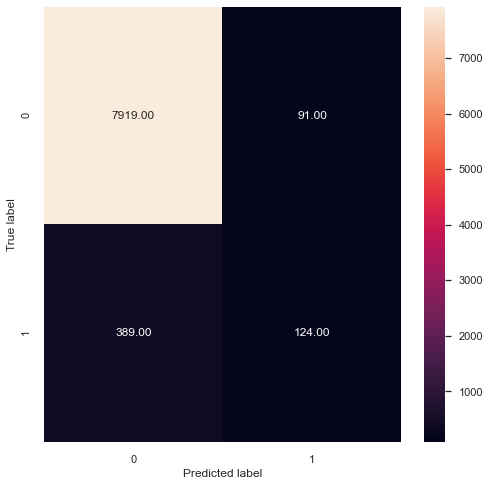

In [ ]:
# CONFUSION MATRIX

draw_confusion_matrix(Y3_test, Y3_predict)

In [ ]:
#accuracy_score, f1_score, recall_score,roc_auc_score, precision_score, confusion_matrix, classification_report
Acc_rfcE3=round(accuracy_score(Y3_test,Y3_predict)*100,2)
Rec_rfcE3=round(recall_score(Y3_test,Y3_predict)*100,2)
Prec_rfcE3=round(precision_score(Y3_test,Y3_predict)*100,2)
F1_rfcE3=round(f1_score(Y3_test,Y3_predict)*100,2)
ROC_rfcE3=round(roc_auc_score(Y3_test,Y3_predict)*100,2)

print("MODEL DT Random Forest ENTROPY after data trmt: Accuracy Score :",Acc_rfcE3)
print()
print("MODEL DT Random Forest ENTROPY: Recall / Sensitivity % :",Rec_rfcE3)
print()
print("MODEL DT Random Forest ENTROPY: Precision % :",Prec_rfcE3)
print()
print("MODEL DT Random Forest ENTROPY: F1 Score % :",F1_rfcE3)
print()
print("MODEL DT Random Forest ENTROPY: Roc Auc Score % :",ROC_rfcE3)

MODEL DT Random Forest ENTROPY after data trmt: Accuracy Score : 94.37

MODEL DT Random Forest ENTROPY: Recall / Sensitivity % : 24.17

MODEL DT Random Forest ENTROPY: Precision % : 57.67

MODEL DT Random Forest ENTROPY: F1 Score % : 34.07

MODEL DT Random Forest ENTROPY: Roc Auc Score % : 61.52


In [ ]:
tempRawResultsDf = pd.DataFrame({'method':['RandomForest after both Outlier removal and SMOTE'], 
                              'accuracy': Acc_rfcE3,
                              'recall':Rec_rfcE3, 
                              'precision':Prec_rfcE3, 
                              'f1':F1_rfcE3, 
                              'roc':ROC_rfcE3
                             }
                            )
rawResultsDF = pd.concat([rawResultsDF, tempRawResultsDf])
rawResultsDF = rawResultsDF[['method', 'accuracy', 'recall', 'precision', 'f1', 'roc']]
rawResultsDF

,method,accuracy,recall,precision,f1,roc
0,LOGIT,89.68,30.82,59.38,40.58,64.05
0,Decision Tree Gini Pruned,90.19,31.27,64.75,42.17,64.54
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Bagging,90.92,49.26,63.19,55.36,72.78
0,ADABoost,89.85,36.75,59.01,45.29,66.73
0,Gradient,90.50,35.98,65.42,46.42,66.76
0,Bagging after Data Trmnt,90.42,46.13,61.24,52.62,71.16
0,Random Forest Entropy after data trmt,90.47,37.64,65.08,47.69,67.50


In [ ]:
rawResultsDF.sort_values(by=['f1','roc', 'precision', 'recall', 'accuracy'],ascending=False)

,method,accuracy,recall,precision,f1,roc
0,Bagging,90.92,49.26,63.19,55.36,72.78
0,Bagging after SMOTE,90.02,52.48,58.41,55.28,73.75
0,Random Forest with Entropy after SMOTE,90.54,46.65,63.27,53.70,71.52
0,Bagging after Data Trmnt,90.42,46.13,61.24,52.62,71.16
0,Random Forest,90.71,40.55,65.05,49.96,68.87
0,Random Forest Entropy,90.70,38.43,66.00,48.57,67.94
0,Random Forest Entropy after data trmt,90.47,37.64,65.08,47.69,67.50
0,Gradient,90.50,35.98,65.42,46.42,66.76
0,ADABoost,89.85,36.75,59.01,45.29,66.73
0,Decision Tree Entropy Pruned,90.14,33.91,62.77,44.04,65.66


# END of ENSEMBLE - ASSIGNMENT 3

## INFERENCE

#### As we see from above tabular column, BAGGING and RandomForest seem to best performers better. 

#### The top performer is Bagging with original dataset (both predictors and also Target) this gives an F1 score of 55.36 and a high precision (63%). That means once a class is identified (recall is at 49%) correctly the model can be trusted at 63%. 

#### The next best performer is Bagging with original predictors but the Target is balanced. This gives an F1 score almost similar 55.28 and 3 point higher recall (identification of a class-52%) correctly, the model can be trusted at 58% (which is 5 point lesser than before). 

#### Computationl Performance between these above two is almost same.

### In general, although the performance statistical metrics are low, tried multiple options of treating the data:

  ##### 1. Drop highly correlated column and do the models
  ##### 2. Drop outlier rows and balance the Target variable
  ##### 3. Maintain the original dataset predictors, but balance the Target variable alone
  
### But, in all these combinations, the performance did not improve from the top 2 mentioned above rather some data treatment made the performance worse.

## Overall, the dataset needs mode treatment more in terms of gathering additional relevant features and apply outliers, balance data for better prediction value.